In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np
import pandas as pd
import datetime
import calendar
import scipy

from pathlib import Path
from run_analysis import postprocess, preprocess, WINDOW_WIDTH, ANEM1_TO_U10, ANEM2_TO_U10
from Modules.DataCleaner import apply_window_wise
from scipy.interpolate import interp1d
from MeterologicalParameters.humidity import cpd as CPD

In [23]:
def to_timestamp(d):
  return calendar.timegm(d.timetuple())

class InterpolatedData:
    def __init__(self, x: pd.Series, y: np.ndarray):
        if type(x.values[0]) is np.datetime64:
            x = x.apply(to_timestamp)
        self.interpolator = interp1d(x, y)
    
    def get_vals(self, x: pd.Series):
        if type(x.values[0]) is np.datetime64:
            x = x.apply(to_timestamp)
        return self.interpolator(x)

def relative_percent_difference(df: pd.DataFrame, x, y):
    if df is not None:
        x = df[x]
        y = df[y]
    
    return np.abs(x - y)/np.min((np.abs(x), np.abs(y)), axis=0)

def normalise(x):
    x_mod = np.abs(x)
    return x / x_mod.max()

def plot_errorbars(df: pd.DataFrame, x, y, binwidth: int, bin_lim=[], **kwargs):
    def get_int(x):
        if type(x) is np.datetime64:
            return to_timestamp(x)
        else:
            return int(x)
    
    if df is not None:
        x = df[x]
        y = df[y]
    
    bins = np.array([0])
    data = np.array([0])
    
    if len(bin_lim) == 0:
        vals = range(get_int(x.min()), get_int(x.max())+1, binwidth)
    else:
        vals = range(bin_lim[0], bin_lim[1]+1, binwidth)
        
    for v in vals:
        new_data = y[(x >= v - binwidth/2) & (x < v + binwidth/2)]
        
        if len(new_data) == 0:
            bins = np.concatenate((bins, v*np.ones(1)))
            data = np.concatenate((data, np.nan*np.zeros(1)))
        
        else:
            bins = np.concatenate((bins, v*np.ones(len(new_data))))
            data = np.concatenate((data, new_data))
    
    bins = bins[1:]
    data = data[1:]
    
    errorbar_df = pd.DataFrame({'bins': bins, 'data': data})
    
    sns.pointplot(data=errorbar_df, x='bins', y='data', **kwargs)

In [4]:
# ALL 2015
eraDf = pd.read_csv(os.path.join('Analysis', 'eraDf.csv'))
remsDf = pd.read_csv(os.path.join('Analysis', 'remsDf.csv'))
outDf = pd.read_csv(os.path.join('Analysis', 'outDf_aggregated.csv'))

np_load_modified = lambda *a,**k: np.load(*a, allow_pickle=True, **k)
with np_load_modified(os.path.join(os.getcwd(), 'Resources', 'REMS', f'meteo_Mar_wind.npz')) as metFile:
    timemet = metFile['timemet.npy']
    U_west_anem_10min = metFile['U_west_anem_10min.npy'] # 10min avg windspeed at flare bridge height (m/s)
    U_west_anem_1min = metFile['U_west_anem_1min.npy']
    U_west_10m_10min = metFile['U_west_10m_10min.npy'] # 10min avg at 10m
    U_west_10m_1min = metFile['U_west_10m_1min.npy']
    U_dirn_west_1 = metFile['U_dirn_west_1.npy']
    U_dirn_west_2 = metFile['U_dirn_west_2.npy']

for month in ['Apr', 'May']:
    with np_load_modified(os.path.join(os.getcwd(), 'Resources', 'REMS', f'meteo_{month}_wind.npz')) as metFile:
        timemet_temp = metFile['timemet.npy']
        U_west_anem_10min_temp = metFile['U_west_anem_10min.npy'] # 10min avg windspeed at flare bridge height (m/s)
        U_west_anem_1min_temp = metFile['U_west_anem_1min.npy']
        U_west_10m_10min_temp = metFile['U_west_10m_10min.npy'] # 10min avg at 10m
        U_west_10m_1min_temp = metFile['U_west_10m_1min.npy']
        U_dirn_west_1_temp = metFile['U_dirn_west_1.npy']
        U_dirn_west_2_temp = metFile['U_dirn_west_2.npy']
    
    timemet = np.concatenate((timemet, timemet_temp))
    U_west_anem_10min = np.concatenate((U_west_anem_10min, U_west_anem_10min_temp))
    U_west_anem_1min = np.concatenate((U_west_anem_1min, U_west_anem_1min_temp))
    U_west_10m_10min = np.concatenate((U_west_10m_10min, U_west_10m_10min_temp))
    U_west_10m_1min = np.concatenate((U_west_10m_1min, U_west_10m_1min_temp))
    U_dirn_west_1 = np.concatenate((U_dirn_west_1, U_dirn_west_1_temp))
    U_dirn_west_2 = np.concatenate((U_dirn_west_2, U_dirn_west_2_temp))
    
windDf = pd.DataFrame({"timemet": timemet, "U_west_10m_10min": U_west_10m_10min, "U_west_10m_1min": U_west_10m_1min,
                        "U_west_anem_10min": U_west_anem_10min, "U_west_anem_1min": U_west_anem_1min,
                        "U_dirn_west_1": U_dirn_west_1, "U_dirn_west_2": U_dirn_west_2})
windDf.sort_values(by='timemet', inplace=True)

remsDf.timemet = remsDf.timemet.apply(lambda x: datetime.datetime.strptime(x, '%Y-%m-%d %H:%M:%S'))
eraDf.timemet = eraDf.timemet.apply(lambda x: datetime.datetime.strptime(x, '%Y-%m-%d %H:%M:%S'))
outDf.time = outDf.time.apply(lambda x: datetime.datetime.strptime(x, '%Y-%m-%d %H:%M:%S'))

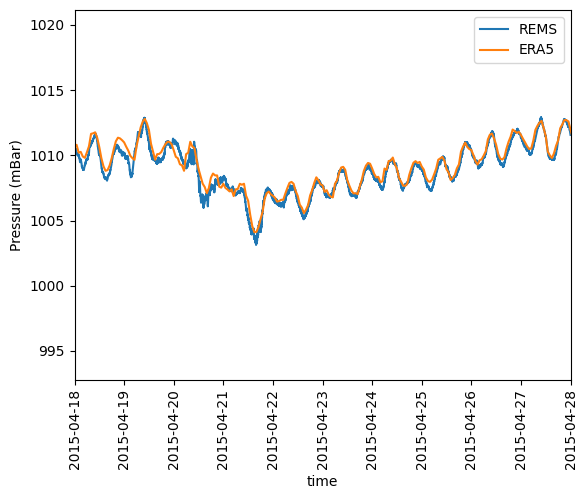

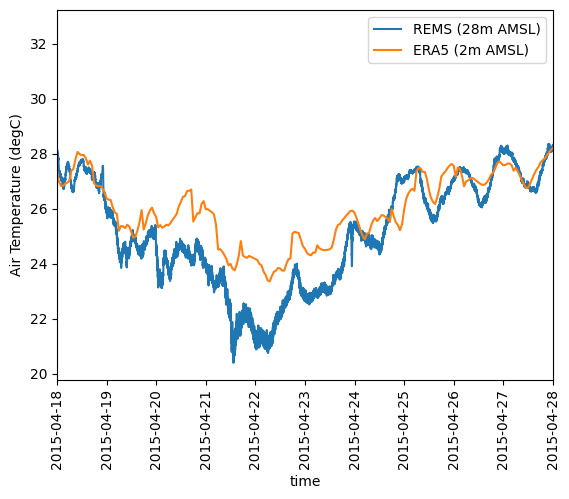

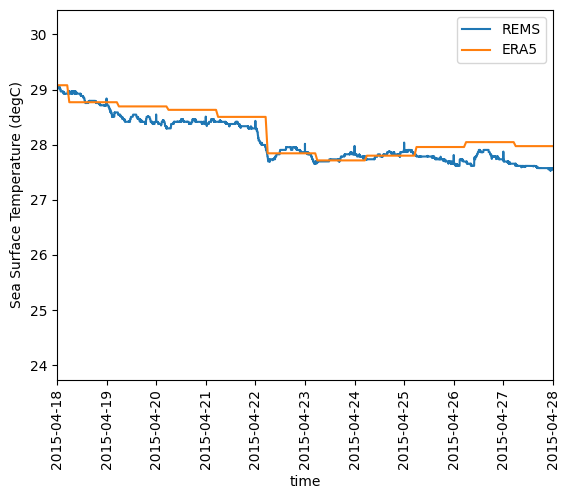

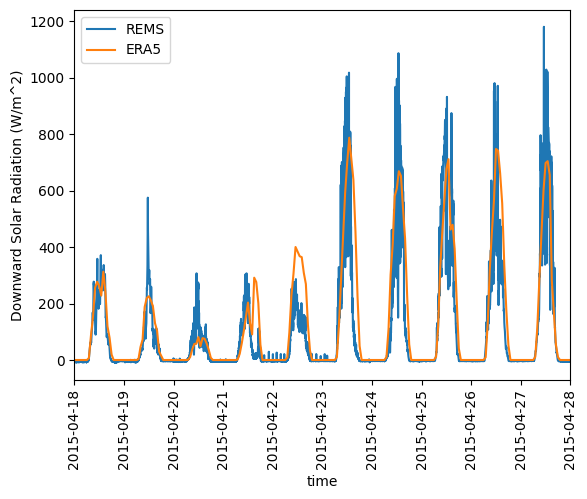

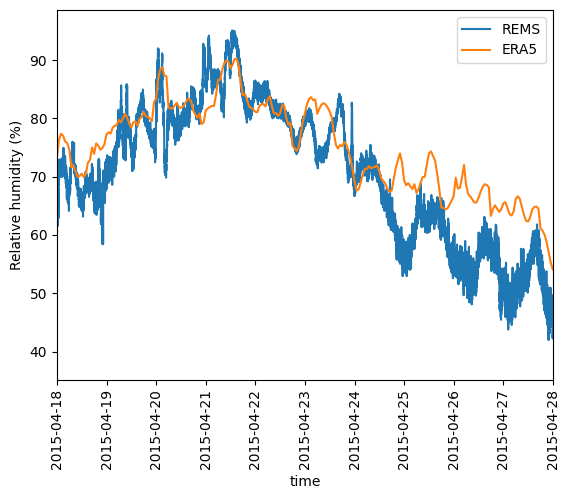

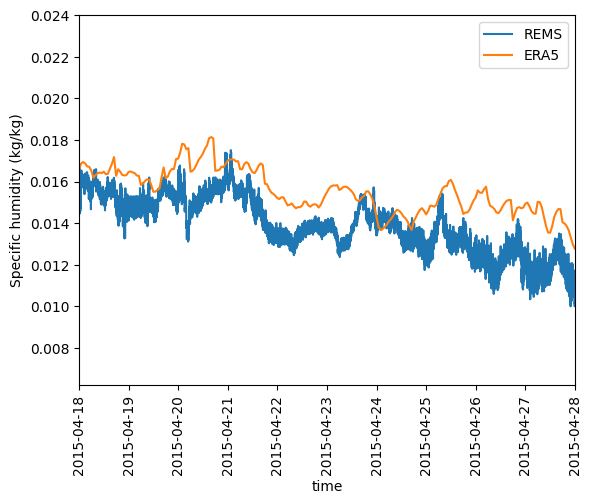

In [4]:
preprocess(eraDf, remsDf, writeDir=None, era_only=False, save_plots=False, time_lim=None);

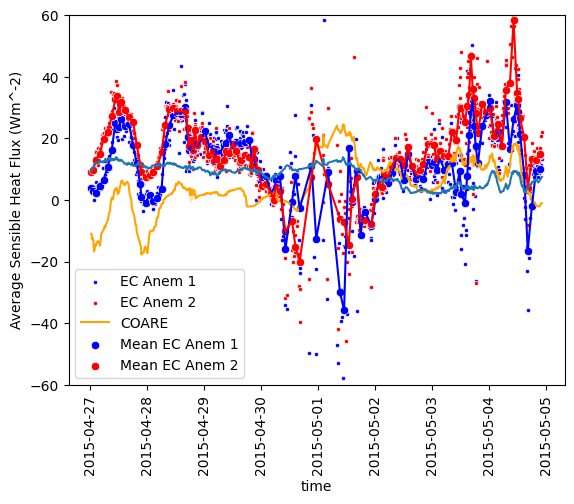

In [5]:
# Quang
logDf = outDf[(outDf.time > datetime.datetime(2015, 4, 27, 0, 0)) & (outDf.time < datetime.datetime(2015, 5, 4, 23, 0))]
# logDf = outDf[(outDf.time > datetime.datetime(2015, 4, 1, 0, 0)) & (outDf.time < datetime.datetime(2015, 4, 8, 23, 0))]
# logDf = logDf[relative_percent_difference(logDf, 'HApprox_1', 'HApprox_2') < 0.5]
# logDf = logDf[np.abs(logDf['HApprox_2'] - logDf['HApprox_1']) < 20]
mean_ec_1 = apply_window_wise(logDf['HApprox_1'], WINDOW_WIDTH, np.mean)
mean_ec_2 = apply_window_wise(logDf['HApprox_2'], WINDOW_WIDTH, np.mean)
sns.scatterplot(x=logDf['time'], y=logDf['HApprox_1'], marker='.', color='blue', label='EC Anem 1')
sns.scatterplot(x=logDf['time'], y=logDf['HApprox_2'], marker='.', color='red', label='EC Anem 2')
sns.lineplot(data=logDf, x='time', y='HCoare_1', color='orange', label='COARE')
sns.scatterplot(x=logDf.time[::WINDOW_WIDTH], y=mean_ec_1, color='blue', label='Mean EC Anem 1')
sns.scatterplot(x=logDf.time[::WINDOW_WIDTH], y=mean_ec_2, color='red', label='Mean EC Anem 2')
sns.lineplot(x=logDf.time[::WINDOW_WIDTH], y=mean_ec_1, color='blue')
sns.lineplot(x=logDf.time[::WINDOW_WIDTH], y=mean_ec_2, color='red')

sns.lineplot(data=logDf, x='time', y='U_anem_1')

plt.xlabel('time')
plt.ylabel('Average Sensible Heat Flux (Wm^-2)')
plt.xticks(plt.xticks()[0], rotation=90)
plt.ylim([-60, 60])
plt.show()

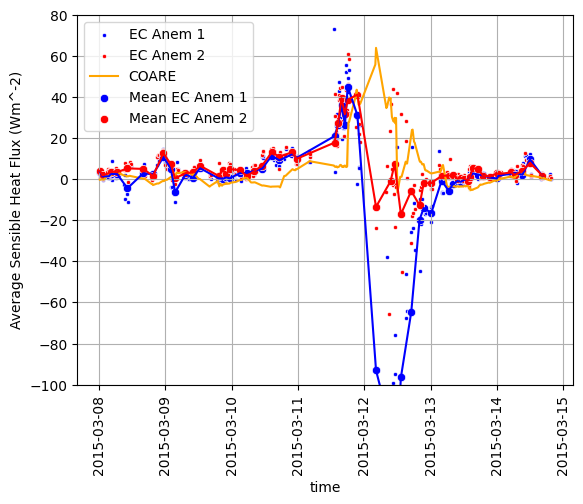

In [6]:
# Olwyn
logDf = outDf[(outDf.time > datetime.datetime(2015, 3, 8, 0, 0)) & (outDf.time < datetime.datetime(2015, 3, 14, 23, 0))]
# logDf = outDf[(outDf.time > datetime.datetime(2015, 3, 3, 0, 0)) & (outDf.time < datetime.datetime(2015, 3, 11, 23, 0))]
# logDf = logDf[relative_percent_difference(logDf, 'HApprox_1', 'HApprox_2') < 0.5]
mean_ec_1 = apply_window_wise(logDf['HApprox_1'], WINDOW_WIDTH, np.mean)
mean_ec_2 = apply_window_wise(logDf['HApprox_2'], WINDOW_WIDTH, np.mean)
sns.scatterplot(x=logDf['time'], y=logDf['HApprox_1'], marker='.', color='blue', label='EC Anem 1')
sns.scatterplot(x=logDf['time'], y=logDf['HApprox_2'], marker='.', color='red', label='EC Anem 2')
sns.lineplot(data=logDf, x='time', y='HCoare_1', color='orange', label='COARE')
sns.scatterplot(x=logDf.time[::WINDOW_WIDTH], y=mean_ec_1, color='blue', label='Mean EC Anem 1')
sns.scatterplot(x=logDf.time[::WINDOW_WIDTH], y=mean_ec_2, color='red', label='Mean EC Anem 2')
sns.lineplot(x=logDf.time[::WINDOW_WIDTH], y=mean_ec_1, color='blue')
sns.lineplot(x=logDf.time[::WINDOW_WIDTH], y=mean_ec_2, color='red')

# sns.lineplot(data=logDf, x='time', y='U_anem_1')

plt.xlabel('time')
plt.ylabel('Average Sensible Heat Flux (Wm^-2)')
plt.xticks(plt.xticks()[0], rotation=90)
plt.ylim([-100, 80])
plt.grid()
plt.show()

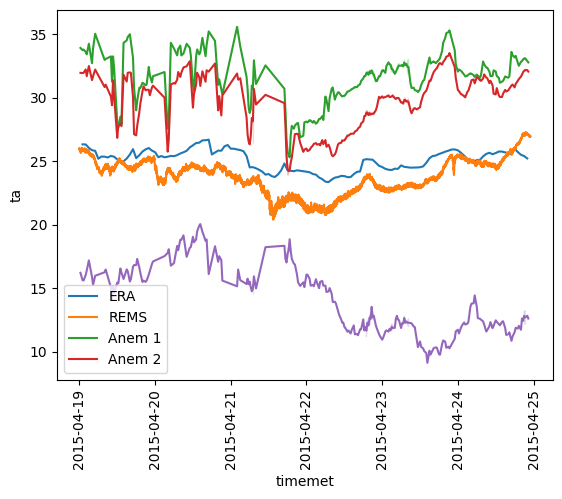

In [17]:
logDf = outDf[(outDf.time > datetime.datetime(2015, 4, 19, 0, 0)) & (outDf.time < datetime.datetime(2015, 4, 24, 23, 0))]
logeraDf = eraDf[(eraDf.timemet > datetime.datetime(2015, 4, 19, 0, 0)) & (eraDf.timemet < datetime.datetime(2015, 4, 24, 23, 0))]
logremsDf = remsDf[(remsDf.timemet > datetime.datetime(2015, 4, 19, 0, 0)) & (remsDf.timemet < datetime.datetime(2015, 4, 24, 23, 0))]

sns.lineplot(x=logeraDf.timemet, y=logeraDf.ta, label='ERA')
sns.lineplot(x=logremsDf.timemet, y=logremsDf.ta, label='REMS')
sns.lineplot(data=logDf, x='time', y='ta_1', label='Anem 1')
sns.lineplot(data=logDf, x='time', y='ta_2', label='Anem 2')

sns.lineplot(data=logDf, x='time', y='U_anem_1')

plt.xticks(plt.xticks()[0], rotation=90)
plt.show()

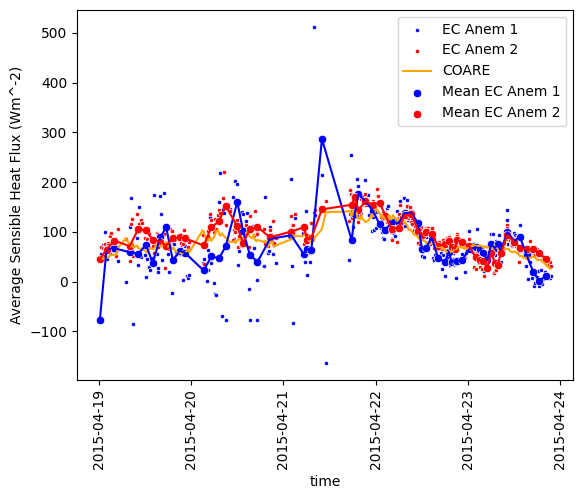

In [7]:
# April Gust
logDf = outDf[(outDf.time > datetime.datetime(2015, 4, 19, 0, 0)) & (outDf.time < datetime.datetime(2015, 4, 23, 23, 0))]
# logDf = outDf[(outDf.time > datetime.datetime(2015, 3, 25, 0, 0)) & (outDf.time < datetime.datetime(2015, 4, 17, 23, 0))]
# logDf = logDf[relative_percent_difference(logDf, 'HApprox_1', 'HApprox_2') < 0.5]
mean_ec_1 = apply_window_wise(logDf['HApprox_1'], WINDOW_WIDTH, np.mean)
mean_ec_2 = apply_window_wise(logDf['HApprox_2'], WINDOW_WIDTH, np.mean)
sns.scatterplot(x=logDf['time'], y=logDf['HApprox_1'], marker='.', color='blue', label='EC Anem 1')
sns.scatterplot(x=logDf['time'], y=logDf['HApprox_2'], marker='.', color='red', label='EC Anem 2')
sns.lineplot(data=logDf, x='time', y='HCoare_1', color='orange', label='COARE')
sns.scatterplot(x=logDf.time[::WINDOW_WIDTH], y=mean_ec_1, color='blue', label='Mean EC Anem 1')
sns.scatterplot(x=logDf.time[::WINDOW_WIDTH], y=mean_ec_2, color='red', label='Mean EC Anem 2')
sns.lineplot(x=logDf.time[::WINDOW_WIDTH], y=mean_ec_1, color='blue')
sns.lineplot(x=logDf.time[::WINDOW_WIDTH], y=mean_ec_2, color='red')
plt.xlabel('time')
plt.ylabel('Average Sensible Heat Flux (Wm^-2)')
plt.xticks(plt.xticks()[0], rotation=90)
plt.show()

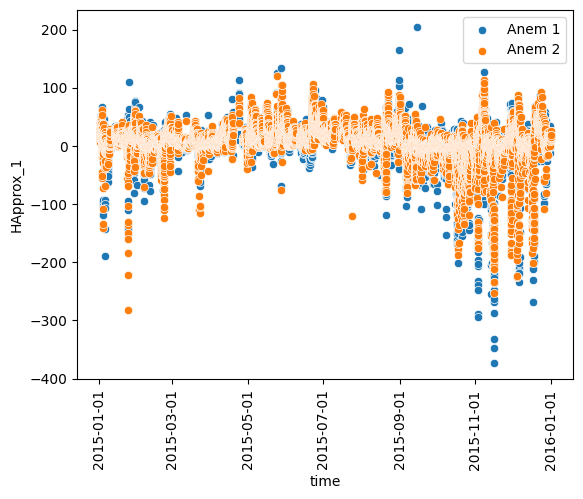

In [8]:
# 2015
logoutDf = outDf[(outDf.U_anem_1 < 10) | (outDf.U_anem_2 < 10)]
logeraDf = eraDf[np.linalg.norm(eraDf[['v_10', 'u_10']].values,axis=1) < 10]

sns.scatterplot(data=logoutDf, x='time', y='HApprox_1', label='Anem 1')
sns.scatterplot(data=logoutDf, x='time', y='HApprox_2', label='Anem 2')
plt.xticks(plt.xticks()[0], rotation=90)
plt.show()

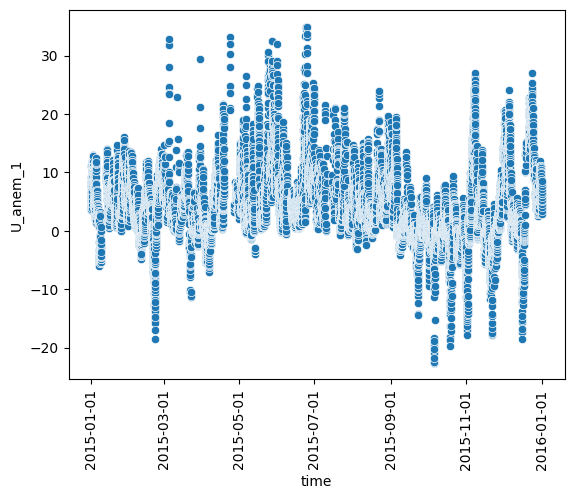

In [20]:
# 2015
logoutDf = outDf[(outDf.U_anem_1 < 10) | (outDf.U_anem_2 < 10)]
logeraDf = eraDf[np.linalg.norm(eraDf[['v_10', 'u_10']].values,axis=1) < 10]

tempdiff = InterpolatedData(x=logeraDf.timemet, y=logeraDf.tsea - logeraDf.ta)
sns.scatterplot(x=logoutDf.time, y=logoutDf.U_anem_1*tempdiff.get_vals(logoutDf.time))
# sns.scatterplot(data=logoutDf, x='time', y='HApprox_1', label='Anem 1')
# sns.scatterplot(data=logoutDf, x='time', y='HApprox_2', label='Anem 2')
plt.xticks(plt.xticks()[0], rotation=90)
plt.show()

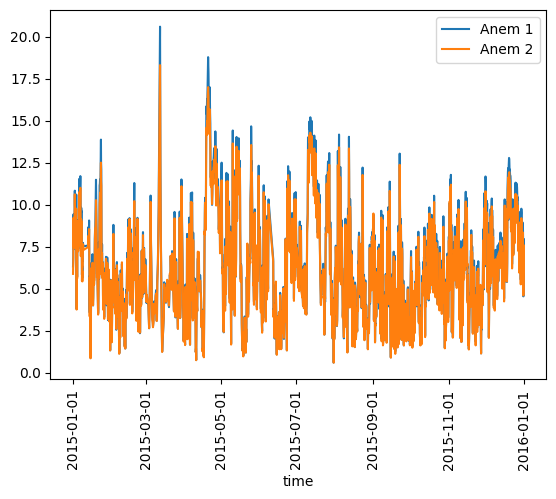

In [12]:
# 2015
logoutDf = outDf#[(outDf.U_anem_1 < 10) | (outDf.U_anem_2 < 10)]
# logeraDf = eraDf[np.linalg.norm(eraDf[['v_10', 'u_10']].values,axis=1) < 10]

mean_u_1 = apply_window_wise(logoutDf['U_anem_1'], 10, np.mean)
mean_u_2 = apply_window_wise(logoutDf['U_anem_2'], 10, np.mean)
sns.lineplot(x=logoutDf.time[::10], y=mean_u_1, label='Anem 1')
sns.lineplot(x=logoutDf.time[::10], y=mean_u_2, label='Anem 2')
plt.xticks(plt.xticks()[0], rotation=90)
plt.show()

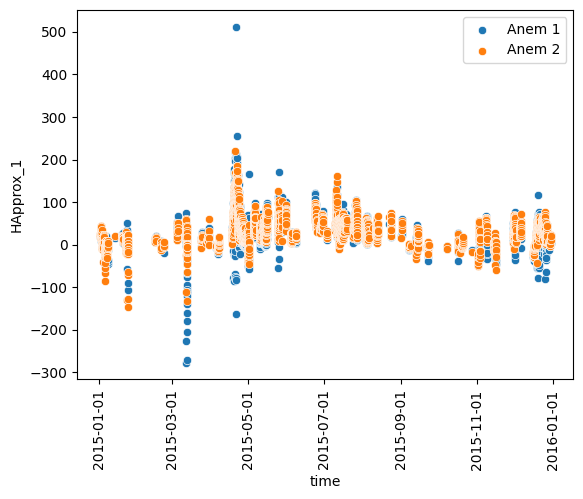

In [9]:
# 2015
logoutDf = outDf[(outDf.U_anem_1 >= 10) | (outDf.U_anem_2 >= 10)]
logeraDf = eraDf[np.linalg.norm(eraDf[['v_10', 'u_10']].values,axis=1) >= 10]

sns.scatterplot(data=logoutDf, x='time', y='HApprox_1', label='Anem 1')
sns.scatterplot(data=logoutDf, x='time', y='HApprox_2', label='Anem 2')
plt.xticks(plt.xticks()[0], rotation=90)
plt.show()

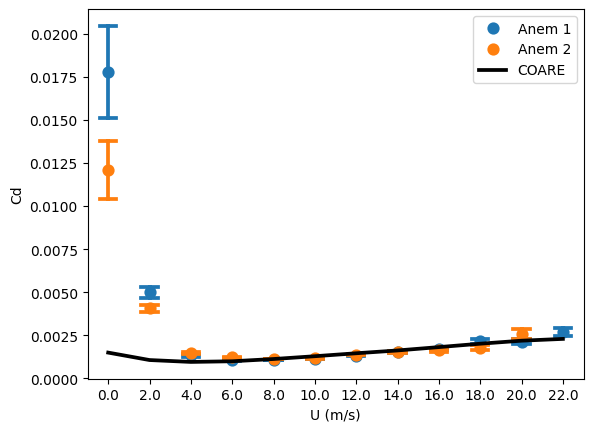

In [5]:
plot_errorbars(outDf, x='U_anem_1', y='Cd_1', binwidth=2, linestyle='none',  capsize=.4, errorbar='ci', label='Anem 1')
plot_errorbars(outDf, x='U_anem_2', y='Cd_2', binwidth=2, linestyle='none',  capsize=.4, errorbar='ci', label='Anem 2')
plot_errorbars(outDf, x='U_anem_1', y='Cd_coare_1', binwidth=2, capsize=.4, marker=None, errorbar=None, label='COARE', color='k')
# plt.xticks(plt.xticks()[0], rotation=90)
# plt.ylim([0, 0.005])
plt.xlabel('U (m/s)')
plt.ylabel('Cd')
plt.show()

Text(0, 0.5, 'Shear Stress')

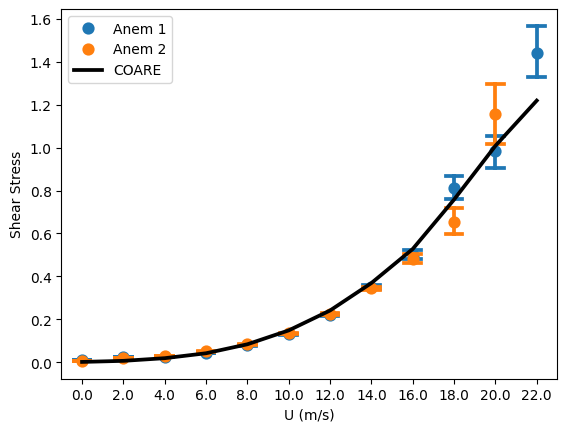

In [4]:
logoutDf = outDf#[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]
plot_errorbars(logoutDf, x='U_anem_1', y='tauApprox_1', binwidth=2, linestyle='none', capsize=.4, errorbar='ci', label='Anem 1')
plot_errorbars(logoutDf, x='U_anem_2', y='tauApprox_2', binwidth=2, linestyle='none', capsize=.4, errorbar='ci', label='Anem 2')
plot_errorbars(logoutDf, x='U_anem_1', y='tauCoare_1', binwidth=2, marker=None, errorbar=None, label='COARE', color='k')
plt.xlabel('U (m/s)')
plt.ylabel('Shear Stress')
# plt.ylim([-0.025, 0.025])
# plt.xlim([15, 22])

(-0.01, 0.01)

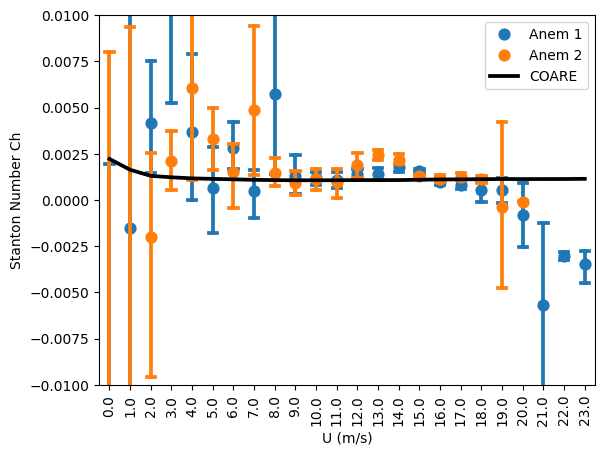

In [5]:
logoutDf = outDf#[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]
# logoutDf = logoutDf[(logoutDf.time < datetime.datetime(2015, 4, 24, 23, 0))]
plot_errorbars(logoutDf, x='U_anem_1', y='Ch_1', binwidth=1, capsize=.4, linestyle='none', errorbar='ci', label='Anem 1')
plot_errorbars(logoutDf, x='U_anem_2', y='Ch_2', binwidth=1, capsize=.4, linestyle='none', errorbar='ci', label='Anem 2')
plot_errorbars(logoutDf, x='U_anem_1', y='Ch_coare_1', binwidth=1, marker=None, errorbar=None, label='COARE', color='k')
plt.xlabel('U (m/s)')
plt.ylabel('Stanton Number Ch')
plt.xticks(plt.xticks()[0], rotation=90)
# plt.ylim([-1, 1])
# plt.ylim([-0.025, 0.025])
plt.ylim([-0.01, 0.01])

(-0.01, 0.01)

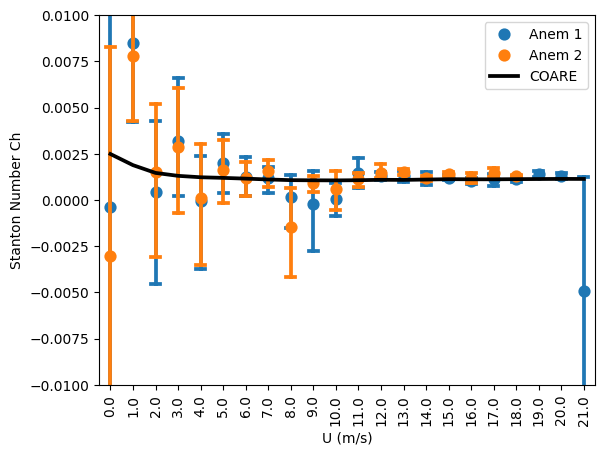

In [13]:
logoutDf = outDf[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]
logoutDf = logoutDf[(logoutDf.time < datetime.datetime(2015, 4, 24, 23, 0))]
plot_errorbars(logoutDf, x='U_anem_1', y='Ch_1', binwidth=1, capsize=.4, linestyle='none', errorbar='ci', label='Anem 1')
plot_errorbars(logoutDf, x='U_anem_2', y='Ch_2', binwidth=1, capsize=.4, linestyle='none', errorbar='ci', label='Anem 2')
plot_errorbars(logoutDf, x='U_anem_1', y='Ch_coare_1', binwidth=1, marker=None, errorbar=None, label='COARE', color='k')
plt.xlabel('U (m/s)')
plt.ylabel('Stanton Number Ch')
plt.xticks(plt.xticks()[0], rotation=90)
# plt.ylim([-1, 1])
# plt.ylim([-0.025, 0.025])
plt.ylim([-0.01, 0.01])

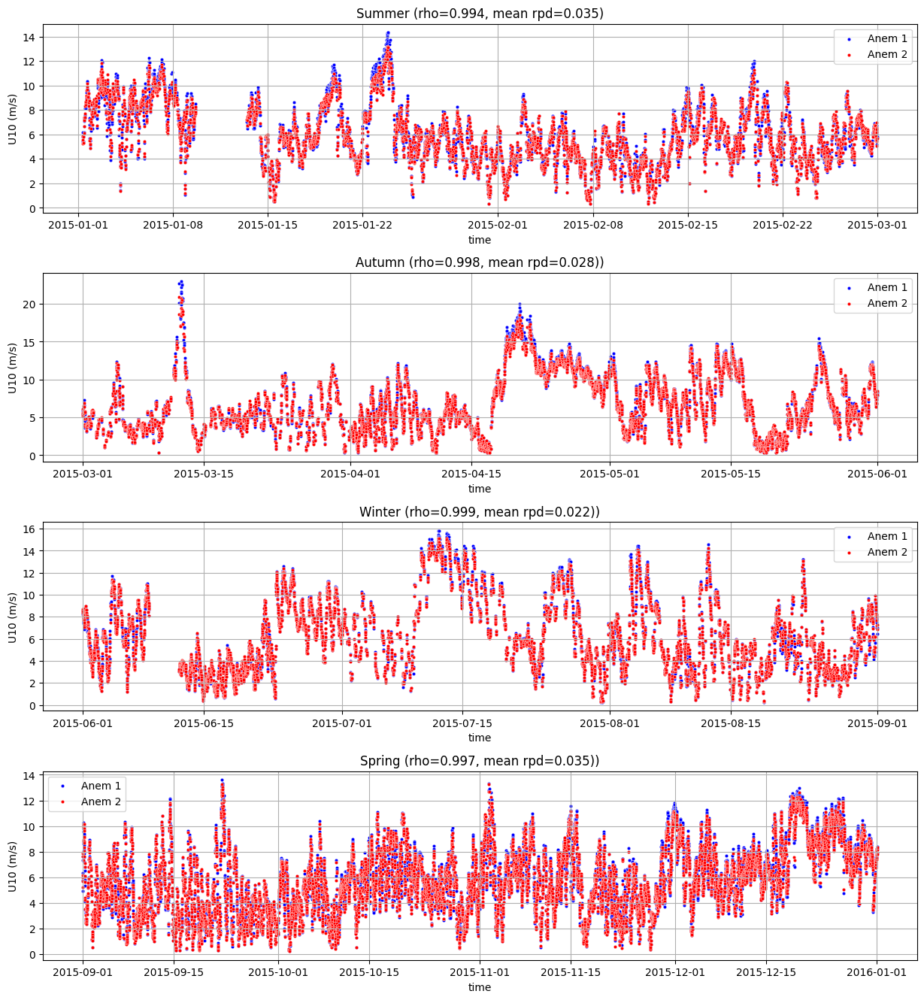

In [27]:
# U10 vs other heights corrected to U10
logoutDf = outDf#[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]

fig, ax = plt.subplots(4, figsize=(15, 15))

season1 = (logoutDf.time < datetime.datetime(2015, 3, 1, 0, 0))
season2 = (logoutDf.time >= datetime.datetime(2015, 3, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 6, 1, 0, 0))
season3 = (logoutDf.time >= datetime.datetime(2015, 6, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 9, 1, 0, 0))
season4 = (logoutDf.time >= datetime.datetime(2015, 9, 1, 0, 0))

pearson_c = []
rpd = []

for i, season in enumerate([season1, season2, season3, season4]):
    seasonDf = logoutDf[season]
    seasonDf = seasonDf.copy(deep=True)
    seasonDf.U_anem_1 *= ANEM1_TO_U10
    seasonDf.U_anem_1 *= ANEM2_TO_U10
    
    sns.scatterplot(x=seasonDf.time, y=seasonDf.U_anem_1, ax=ax[i], label='Anem 1', color='blue', s=10)
    sns.scatterplot(x=seasonDf.time, y=seasonDf.U_anem_2, ax=ax[i], label='Anem 2', color='red', s=10)
    
    ax[i].set_ylabel('U10 (m/s)')
    
    logical = pd.notna(seasonDf.U_anem_1 + seasonDf.U_anem_2)
    p_val = scipy.stats.pearsonr(seasonDf.U_anem_1[logical], seasonDf.U_anem_2[logical])
    pearson_c.append(p_val.statistic)
    err = relative_percent_difference(df=seasonDf, x='U_anem_1', y='U_anem_2')
    rpd.append(err.mean())

ax[0].set_title(f'Summer (rho={round(pearson_c[0],3)}, mean rpd={round(rpd[0],3)})')
ax[1].set_title(f'Autumn (rho={round(pearson_c[1],3)}, mean rpd={round(rpd[1],3)}))')
ax[2].set_title(f'Winter (rho={round(pearson_c[2],3)}, mean rpd={round(rpd[2],3)}))')
ax[3].set_title(f'Spring (rho={round(pearson_c[3],3)}, mean rpd={round(rpd[3],3)}))')

y_offset = 0
y_offset_delta = -0.02
for axis in ax:
#     axis.set_ylim([0, 25])
    axis.grid()
    
    pos = axis.get_position()
    axis.set_position([pos.x0, pos.y0 + y_offset, pos.width, pos.height])
    y_offset += y_offset_delta

plt.show()

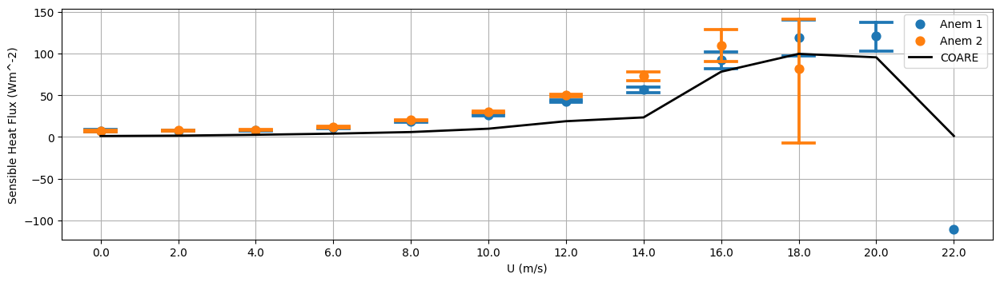

In [25]:
# Full year

logoutDf = outDf[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]
logoutDf = logoutDf.copy(deep=True)

fig, ax = plt.subplots(1, figsize=(15, 15/4))
plot_errorbars(logoutDf, x='U_anem_1', y='HApprox_1', binwidth=2, bin_lim=[0, 22], linestyle='none', capsize=.4, errorbar='ci', label='Anem 1', ax=ax)
plot_errorbars(logoutDf, x='U_anem_2', y='HApprox_2', binwidth=2, bin_lim=[0, 22], linestyle='none',  capsize=.4, errorbar='ci', label='Anem 2', ax=ax)
plot_errorbars(logoutDf, x='U_anem_1', y='HCoare_1', binwidth=2, bin_lim=[0, 22], errorbar=None, marker=None, linewidth=2, label='COARE', color='k', ax=ax)

ax.set_xlabel('U (m/s)')
ax.set_ylabel('Sensible Heat Flux (Wm^-2)')
# # plt.ylim([-300, 300])
ax.grid()
plt.show()

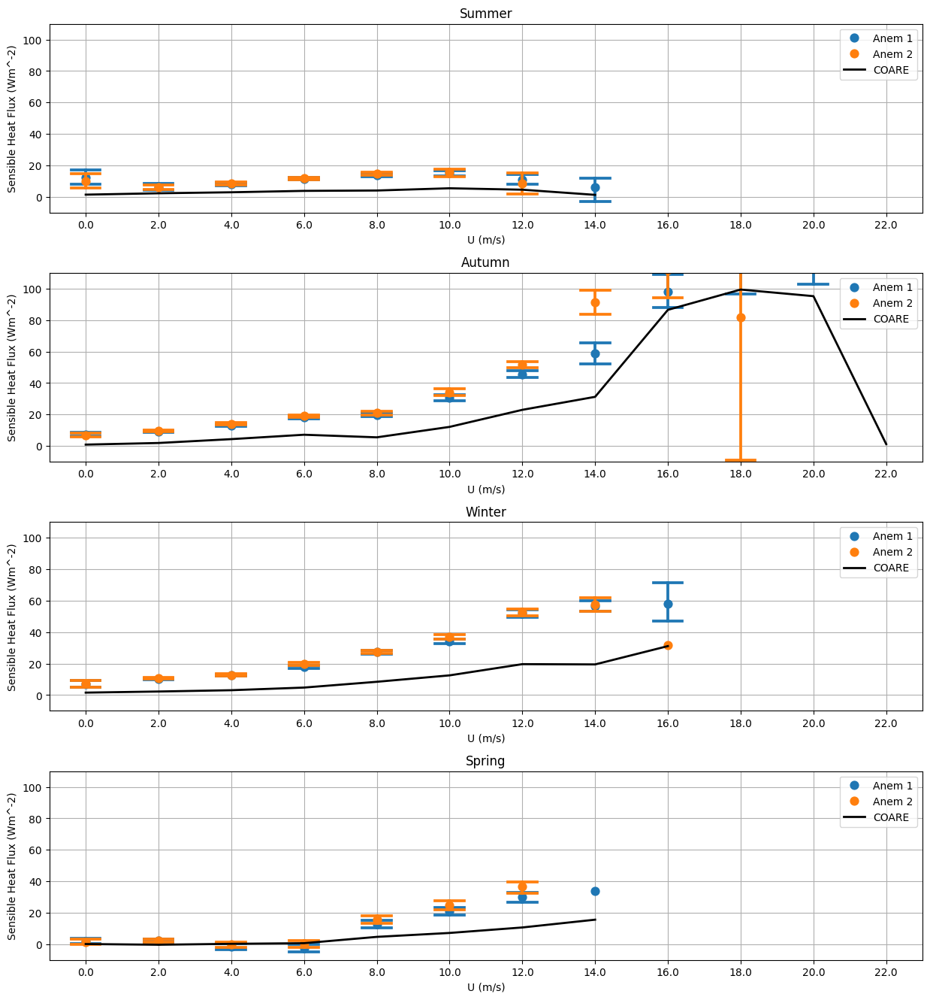

In [30]:
# Full year seasons

logoutDf = outDf[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]

fig, ax = plt.subplots(4, figsize=(15, 15))

season1 = (logoutDf.time < datetime.datetime(2015, 3, 1, 0, 0))
season2 = (logoutDf.time >= datetime.datetime(2015, 3, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 6, 1, 0, 0))
season3 = (logoutDf.time >= datetime.datetime(2015, 6, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 9, 1, 0, 0))
season4 = (logoutDf.time >= datetime.datetime(2015, 9, 1, 0, 0))

for i, season in enumerate([season1, season2, season3, season4]):
    seasonDf = logoutDf[season]
    seasonDf = seasonDf.copy(deep=True)
    
    plot_errorbars(seasonDf, x='U_anem_1', y='HApprox_1', binwidth=2, bin_lim=[0, 22], linestyle='none', capsize=.4, errorbar='ci', label='Anem 1', ax=ax[i])
    plot_errorbars(seasonDf, x='U_anem_2', y='HApprox_2', binwidth=2, bin_lim=[0, 22], linestyle='none',  capsize=.4, errorbar='ci', label='Anem 2', ax=ax[i])
    plot_errorbars(seasonDf, x='U_anem_1', y='HCoare_1', binwidth=2, bin_lim=[0, 22], errorbar=None, marker=None, linewidth=2, label='COARE', color='k', ax=ax[i])

ax[0].set_title('Summer')
ax[1].set_title('Autumn')
ax[2].set_title('Winter')
ax[3].set_title('Spring')

y_offset = 0
y_offset_delta = -0.02
for axis in ax:
    axis.set_xlabel('U (m/s)')
    axis.set_ylabel('Sensible Heat Flux (Wm^-2)')
    axis.set_ylim([-10, 110])
    axis.grid()
    
    pos = axis.get_position()
    axis.set_position([pos.x0, pos.y0 + y_offset, pos.width, pos.height])
    y_offset += y_offset_delta

plt.show()

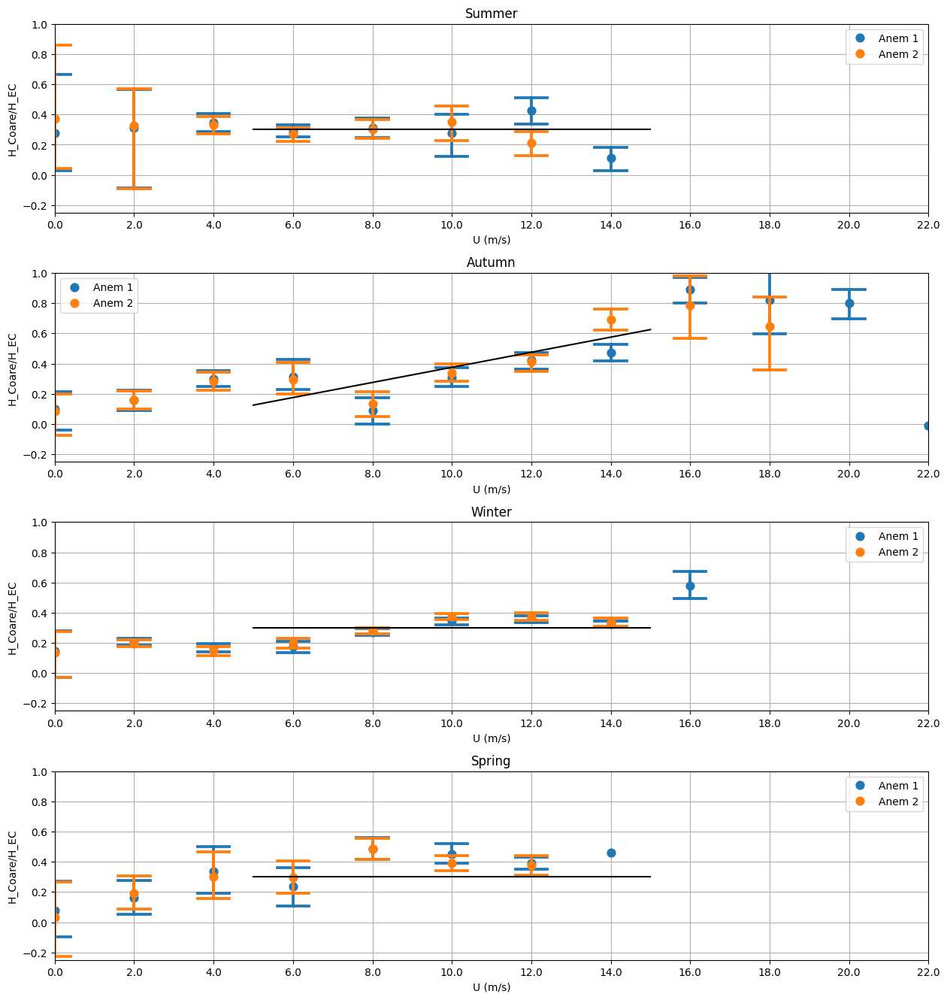

In [11]:
# Hc/Hec vs U
TRUE_TO_BIN = 0.5

logoutDf = outDf[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]

fig, ax = plt.subplots(4, figsize=(15, 15))

season1 = (logoutDf.time < datetime.datetime(2015, 3, 1, 0, 0))
season2 = (logoutDf.time >= datetime.datetime(2015, 3, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 6, 1, 0, 0))
season3 = (logoutDf.time >= datetime.datetime(2015, 6, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 9, 1, 0, 0))
season4 = (logoutDf.time >= datetime.datetime(2015, 9, 1, 0, 0))

for i, season in enumerate([season1, season2, season3, season4]):
    seasonDf = logoutDf[season]
    plot_errorbars(None, x=seasonDf.U_anem_1, y=seasonDf.HCoare_1/seasonDf.HApprox_1, binwidth=2, bin_lim=[0, 22], capsize=.4, errorbar='ci', linestyle='none', label='Anem 1', ax=ax[i])
    plot_errorbars(None, x=seasonDf.U_anem_2, y=seasonDf.HCoare_2/seasonDf.HApprox_2, binwidth=2, bin_lim=[0, 22],  capsize=.4, errorbar='ci', linestyle='none', label='Anem 2', ax=ax[i])
    
    error_coeff = [(0, 0.3), (0.05, -0.125), (0, 0.3), (0, 0.3)]
    x_vals = np.linspace(5, 15, num=2)
    sns.lineplot(x=TRUE_TO_BIN*x_vals, y=error_coeff[i][0]*x_vals + error_coeff[i][1]*np.ones(2), ax=ax[i], color='k')

ax[0].set_title('Summer')
ax[1].set_title('Autumn')
ax[2].set_title('Winter')
ax[3].set_title('Spring')

y_offset = 0
y_offset_delta = -0.02
for axis in ax:
    axis.set_xlabel('U (m/s)')
    axis.set_ylabel('H_Coare/H_EC')
    axis.set_ylim([-0.25, 1])
    axis.set_xlim([0, 22*TRUE_TO_BIN])
    axis.grid()
    
    pos = axis.get_position()
    axis.set_position([pos.x0, pos.y0 + y_offset, pos.width, pos.height])
    y_offset += y_offset_delta

plt.show()

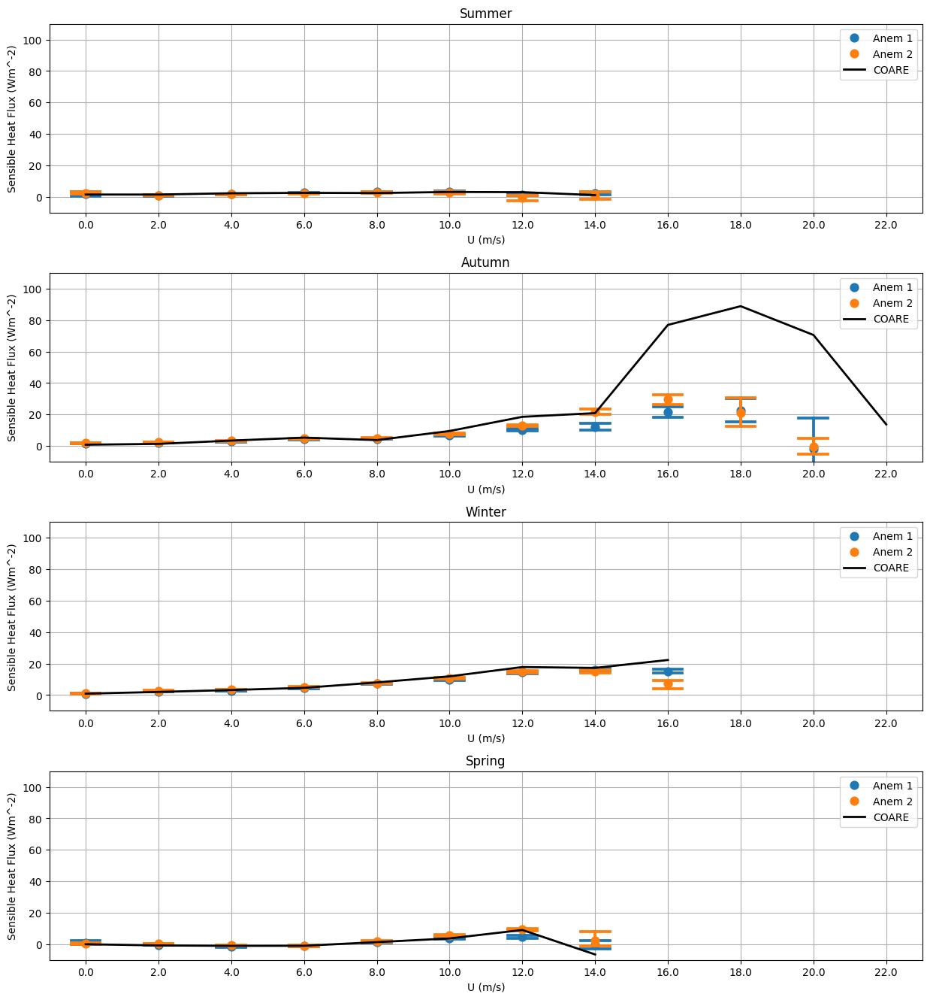

In [28]:
# Full year seasons
logoutDf = outDf#[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]

fig, ax = plt.subplots(4, figsize=(15, 15))

season1 = (logoutDf.time < datetime.datetime(2015, 3, 1, 0, 0))
season2 = (logoutDf.time >= datetime.datetime(2015, 3, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 6, 1, 0, 0))
season3 = (logoutDf.time >= datetime.datetime(2015, 6, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 9, 1, 0, 0))
season4 = (logoutDf.time >= datetime.datetime(2015, 9, 1, 0, 0))

for i, season in enumerate([season1, season2, season3, season4]):
    seasonDf = logoutDf[season]
    seasonDf = seasonDf.copy(deep=True)
    if i == 1:
        seasonDf.HApprox_1 *= 0.3 #0.05*seasonDf.U_anem_1 + -0.125
        seasonDf.HApprox_2 *= 0.3 #0.05*seasonDf.U_anem_2 + -0.125
    else:
        seasonDf.HApprox_1 *= 0.3
        seasonDf.HApprox_2 *= 0.3
    
    plot_errorbars(seasonDf, x='U_anem_1', y='HApprox_1', binwidth=2, bin_lim=[0, 22], linestyle='none', capsize=.4, errorbar='ci', label='Anem 1', ax=ax[i])
    plot_errorbars(seasonDf, x='U_anem_2', y='HApprox_2', binwidth=2, bin_lim=[0, 22], linestyle='none',  capsize=.4, errorbar='ci', label='Anem 2', ax=ax[i])
    plot_errorbars(seasonDf, x='U_anem_1', y='HCoare_1', binwidth=2, bin_lim=[0, 22], errorbar=None, marker=None, linewidth=2, label='COARE', color='k', ax=ax[i])

ax[0].set_title('Summer')
ax[1].set_title('Autumn')
ax[2].set_title('Winter')
ax[3].set_title('Spring')

y_offset = 0
y_offset_delta = -0.02
for axis in ax:
    axis.set_xlabel('U (m/s)')
    axis.set_ylabel('Sensible Heat Flux (Wm^-2)')
    axis.set_ylim([-10, 110])
    axis.grid()
    
    pos = axis.get_position()
    axis.set_position([pos.x0, pos.y0 + y_offset, pos.width, pos.height])
    y_offset += y_offset_delta

plt.show()

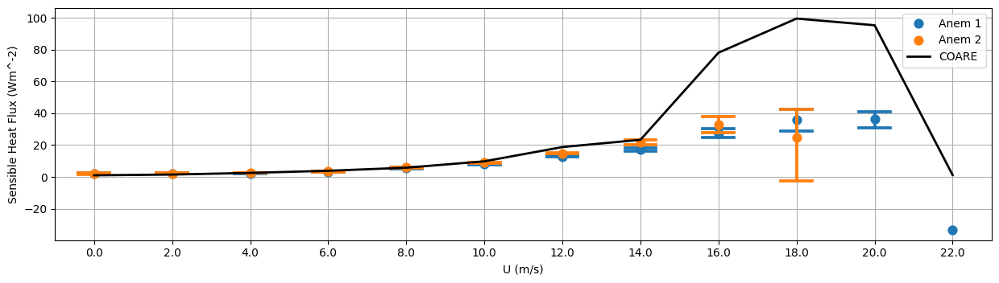

In [29]:
# Full year
logoutDf = outDf[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]
logoutDf = logoutDf.copy(deep=True)

for i, row in logoutDf.iterrows():
    if row.time >= datetime.datetime(2015, 3, 1, 0, 0) and row.time < datetime.datetime(2015, 6, 1, 0, 0):
        c1 = 0.3 #0.05*row.U_anem_1 + -0.125
        c2 = 0.3 #0.05*row.U_anem_2 + -0.125
    else:
        c1 = 0.3
        c2 = 0.3
    
    logoutDf.at[i, 'HApprox_1'] *= c1
    logoutDf.at[i, 'HApprox_2'] *= c2

fig, ax = plt.subplots(1, figsize=(15, 15/4))
plot_errorbars(logoutDf, x='U_anem_1', y='HApprox_1', binwidth=2, bin_lim=[0, 22], linestyle='none', capsize=.4, errorbar='ci', label='Anem 1', ax=ax)
plot_errorbars(logoutDf, x='U_anem_2', y='HApprox_2', binwidth=2, bin_lim=[0, 22], linestyle='none',  capsize=.4, errorbar='ci', label='Anem 2', ax=ax)
plot_errorbars(logoutDf, x='U_anem_1', y='HCoare_1', binwidth=2, bin_lim=[0, 22], errorbar=None, marker=None, linewidth=2, label='COARE', color='k', ax=ax)

ax.set_xlabel('U (m/s)')
ax.set_ylabel('Sensible Heat Flux (Wm^-2)')
# # plt.ylim([-300, 300])
ax.grid()
plt.show()

In [17]:
x = np.linspace(0, 10, num=10)
y = np.linspace(0, -10, num=10)
print(scipy.stats.pearsonr(x, y).statistic)

-1.0


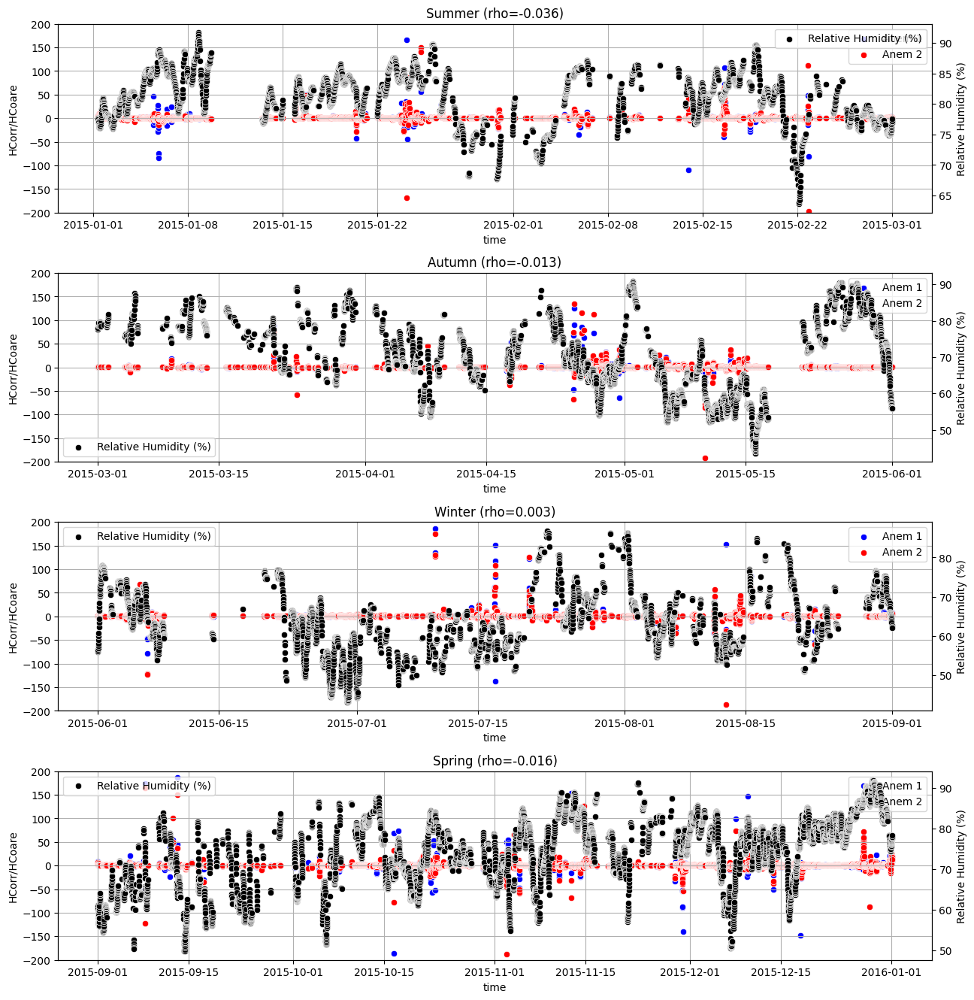

In [107]:
# Q correlation for U correction over time
logoutDf = outDf#[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]
logoutDf = logoutDf[(logoutDf.U_anem_1 >= 5) & (logoutDf.U_anem_1 <= 15) & (logoutDf.U_anem_2 >= 5) & (logoutDf.U_anem_2 <= 15)]

fig, ax = plt.subplots(4, figsize=(15, 15))

season1 = (logoutDf.time < datetime.datetime(2015, 3, 1, 0, 0))
season2 = (logoutDf.time >= datetime.datetime(2015, 3, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 6, 1, 0, 0))
season3 = (logoutDf.time >= datetime.datetime(2015, 6, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 9, 1, 0, 0))
season4 = (logoutDf.time >= datetime.datetime(2015, 9, 1, 0, 0))

hum = InterpolatedData(x=eraDf.timemet, y=eraDf.rh)

pearson_c = []

for i, season in enumerate([season1, season2, season3, season4]):
    seasonDf = logoutDf[season]
    seasonDf = seasonDf.copy(deep=True)
    if i == 1:
        seasonDf.HApprox_1 *= 0.05*seasonDf.U_anem_1 + -0.125
        seasonDf.HApprox_2 *= 0.05*seasonDf.U_anem_2 + -0.125
    else:
        seasonDf.HApprox_1 *= 0.3
        seasonDf.HApprox_2 *= 0.3
    
    twin = ax[i].twinx()
    sns.scatterplot(x=seasonDf.time, y=seasonDf.HApprox_1/seasonDf.HCoare_1, ax=ax[i], label='Anem 1', color='blue')
    sns.scatterplot(x=seasonDf.time, y=seasonDf.HApprox_2/seasonDf.HCoare_2, ax=ax[i], label='Anem 2', color='red')
    sns.scatterplot(x=seasonDf.time, y=hum.get_vals(seasonDf.time), ax=twin, label='Relative Humidity (%)', color='k')
    
    ax[i].set_ylabel('HCorr/HCoare')
    twin.set_ylabel('Relative Humidity (%)')
    
    logical = pd.notna(seasonDf.HApprox_1/seasonDf.HCoare_1)
    p_val = scipy.stats.pearsonr(hum.get_vals(seasonDf.time[logical]), seasonDf.HApprox_1[logical]/seasonDf.HCoare_1[logical])
    pearson_c.append(p_val.statistic)

ax[0].set_title(f'Summer (rho={round(pearson_c[0],3)})')
ax[1].set_title(f'Autumn (rho={round(pearson_c[1],3)})')
ax[2].set_title(f'Winter (rho={round(pearson_c[2],3)})')
ax[3].set_title(f'Spring (rho={round(pearson_c[3],3)})')

y_offset = 0
y_offset_delta = -0.02
for axis in ax:
    axis.set_ylim([-200, 200])
    axis.grid()
    
    pos = axis.get_position()
    axis.set_position([pos.x0, pos.y0 + y_offset, pos.width, pos.height])
    y_offset += y_offset_delta

plt.show()

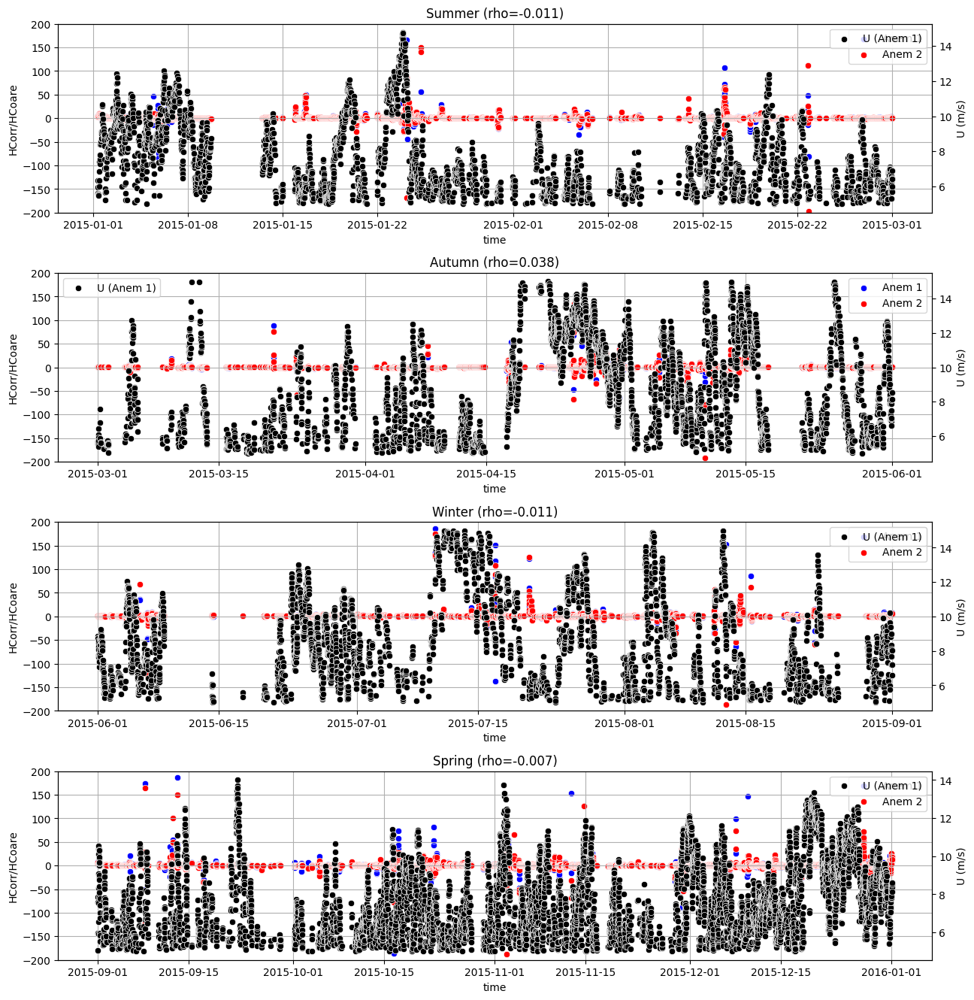

In [106]:
# U correlation for U correction over time
logoutDf = outDf#[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]
logoutDf = logoutDf[(logoutDf.U_anem_1 >= 5) & (logoutDf.U_anem_1 <= 15) & (logoutDf.U_anem_2 >= 5) & (logoutDf.U_anem_2 <= 15)]

fig, ax = plt.subplots(4, figsize=(15, 15))

season1 = (logoutDf.time < datetime.datetime(2015, 3, 1, 0, 0))
season2 = (logoutDf.time >= datetime.datetime(2015, 3, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 6, 1, 0, 0))
season3 = (logoutDf.time >= datetime.datetime(2015, 6, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 9, 1, 0, 0))
season4 = (logoutDf.time >= datetime.datetime(2015, 9, 1, 0, 0))

pearson_c = []

for i, season in enumerate([season1, season2, season3, season4]):
    seasonDf = logoutDf[season]
    seasonDf = seasonDf.copy(deep=True)
    if i == 1:
        seasonDf.HApprox_1 *= 0.05*seasonDf.U_anem_1 + -0.125
        seasonDf.HApprox_2 *= 0.05*seasonDf.U_anem_2 + -0.125
    else:
        seasonDf.HApprox_1 *= 0.3
        seasonDf.HApprox_2 *= 0.3
    
    twin = ax[i].twinx()
    sns.scatterplot(x=seasonDf.time, y=seasonDf.HApprox_1/seasonDf.HCoare_1, ax=ax[i], label='Anem 1', color='blue')
    sns.scatterplot(x=seasonDf.time, y=seasonDf.HApprox_2/seasonDf.HCoare_2, ax=ax[i], label='Anem 2', color='red')
    sns.scatterplot(x=seasonDf.time, y=seasonDf.U_anem_1, ax=twin, label='U (Anem 1)', color='k')
    
    ax[i].set_ylabel('HCorr/HCoare')
    twin.set_ylabel('U (m/s)')
    
    logical = pd.notna(seasonDf.HApprox_1/seasonDf.HCoare_1)
    p_val = scipy.stats.pearsonr(seasonDf.U_anem_1[logical], seasonDf.HApprox_1[logical]/seasonDf.HCoare_1[logical])
    pearson_c.append(p_val.statistic)

ax[0].set_title(f'Summer (rho={round(pearson_c[0],3)})')
ax[1].set_title(f'Autumn (rho={round(pearson_c[1],3)})')
ax[2].set_title(f'Winter (rho={round(pearson_c[2],3)})')
ax[3].set_title(f'Spring (rho={round(pearson_c[3],3)})')

y_offset = 0
y_offset_delta = -0.02
for axis in ax:
    axis.set_ylim([-200, 200])
    axis.grid()
    
    pos = axis.get_position()
    axis.set_position([pos.x0, pos.y0 + y_offset, pos.width, pos.height])
    y_offset += y_offset_delta

plt.show()

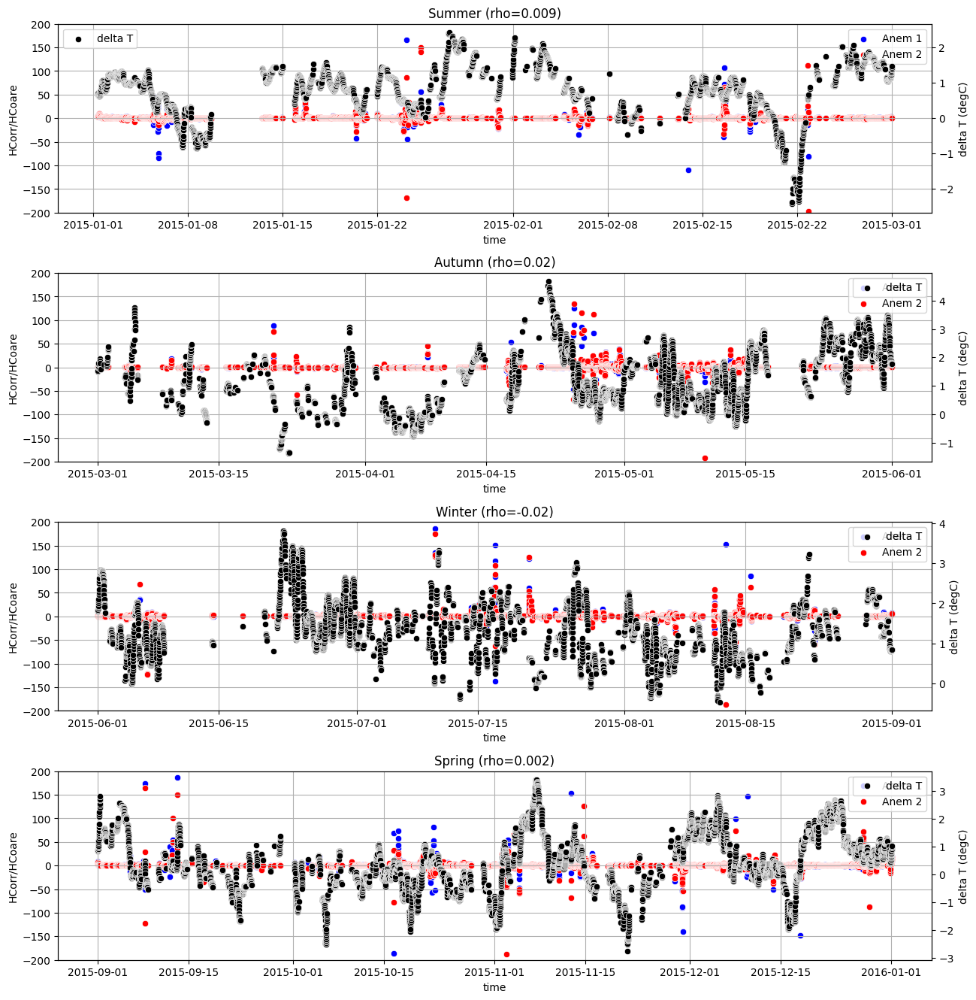

In [105]:
# delta T correlation for U correction over time
logoutDf = outDf#[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]
logoutDf = logoutDf[(logoutDf.U_anem_1 >= 5) & (logoutDf.U_anem_1 <= 15) & (logoutDf.U_anem_2 >= 5) & (logoutDf.U_anem_2 <= 15)]

fig, ax = plt.subplots(4, figsize=(15, 15))

season1 = (logoutDf.time < datetime.datetime(2015, 3, 1, 0, 0))
season2 = (logoutDf.time >= datetime.datetime(2015, 3, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 6, 1, 0, 0))
season3 = (logoutDf.time >= datetime.datetime(2015, 6, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 9, 1, 0, 0))
season4 = (logoutDf.time >= datetime.datetime(2015, 9, 1, 0, 0))

pearson_c = []

tempdiff = InterpolatedData(x=eraDf.timemet, y=eraDf.tsea - eraDf.ta)

for i, season in enumerate([season1, season2, season3, season4]):
    seasonDf = logoutDf[season]
    seasonDf = seasonDf.copy(deep=True)
    if i == 1:
        seasonDf.HApprox_1 *= 0.05*seasonDf.U_anem_1 + -0.125
        seasonDf.HApprox_2 *= 0.05*seasonDf.U_anem_2 + -0.125
    else:
        seasonDf.HApprox_1 *= 0.3
        seasonDf.HApprox_2 *= 0.3
    
    deltaT = tempdiff.get_vals(seasonDf.time)
    
    twin = ax[i].twinx()
    sns.scatterplot(x=seasonDf.time, y=seasonDf.HApprox_1/seasonDf.HCoare_1, ax=ax[i], label='Anem 1', color='blue')
    sns.scatterplot(x=seasonDf.time, y=seasonDf.HApprox_2/seasonDf.HCoare_2, ax=ax[i], label='Anem 2', color='red')
    sns.scatterplot(x=seasonDf.time, y=deltaT, ax=twin, label='delta T', color='k')
    
    ax[i].set_ylabel('HCorr/HCoare')
    twin.set_ylabel('delta T (degC)')
    
    logical = pd.notna(seasonDf.HApprox_1/seasonDf.HCoare_1)
    p_val = scipy.stats.pearsonr(deltaT[logical], seasonDf.HApprox_1[logical]/seasonDf.HCoare_1[logical])
    pearson_c.append(p_val.statistic)

ax[0].set_title(f'Summer (rho={round(pearson_c[0],3)})')
ax[1].set_title(f'Autumn (rho={round(pearson_c[1],3)})')
ax[2].set_title(f'Winter (rho={round(pearson_c[2],3)})')
ax[3].set_title(f'Spring (rho={round(pearson_c[3],3)})')

y_offset = 0
y_offset_delta = -0.02
for axis in ax:
    axis.set_ylim([-200, 200])
    axis.grid()
    
    pos = axis.get_position()
    axis.set_position([pos.x0, pos.y0 + y_offset, pos.width, pos.height])
    y_offset += y_offset_delta

plt.show()

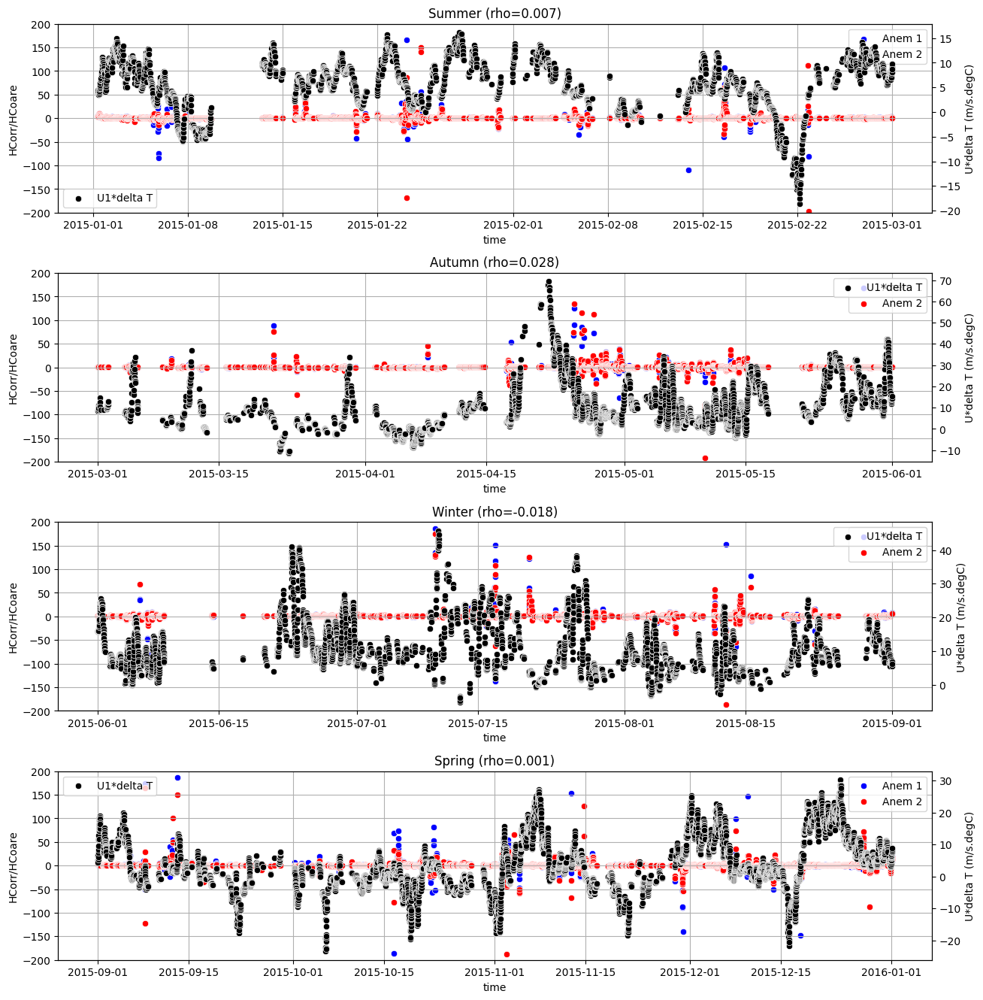

In [108]:
# U*delta T correlation for U correction over time
logoutDf = outDf#[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]
logoutDf = logoutDf[(logoutDf.U_anem_1 >= 5) & (logoutDf.U_anem_1 <= 15) & (logoutDf.U_anem_2 >= 5) & (logoutDf.U_anem_2 <= 15)]

fig, ax = plt.subplots(4, figsize=(15, 15))

season1 = (logoutDf.time < datetime.datetime(2015, 3, 1, 0, 0))
season2 = (logoutDf.time >= datetime.datetime(2015, 3, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 6, 1, 0, 0))
season3 = (logoutDf.time >= datetime.datetime(2015, 6, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 9, 1, 0, 0))
season4 = (logoutDf.time >= datetime.datetime(2015, 9, 1, 0, 0))

pearson_c = []

tempdiff = InterpolatedData(x=eraDf.timemet, y=eraDf.tsea - eraDf.ta)

for i, season in enumerate([season1, season2, season3, season4]):
    seasonDf = logoutDf[season]
    seasonDf = seasonDf.copy(deep=True)
    if i == 1:
        seasonDf.HApprox_1 *= 0.05*seasonDf.U_anem_1 + -0.125
        seasonDf.HApprox_2 *= 0.05*seasonDf.U_anem_2 + -0.125
    else:
        seasonDf.HApprox_1 *= 0.3
        seasonDf.HApprox_2 *= 0.3
    
    deltaT = tempdiff.get_vals(seasonDf.time)
    
    twin = ax[i].twinx()
    sns.scatterplot(x=seasonDf.time, y=seasonDf.HApprox_1/seasonDf.HCoare_1, ax=ax[i], label='Anem 1', color='blue')
    sns.scatterplot(x=seasonDf.time, y=seasonDf.HApprox_2/seasonDf.HCoare_2, ax=ax[i], label='Anem 2', color='red')
    sns.scatterplot(x=seasonDf.time, y=seasonDf.U_anem_1*deltaT, ax=twin, label='U1*delta T', color='k')
    
    ax[i].set_ylabel('HCorr/HCoare')
    twin.set_ylabel('U*delta T (m/s.degC)')
    
    logical = pd.notna(seasonDf.HApprox_1/seasonDf.HCoare_1)
    p_val = scipy.stats.pearsonr(deltaT[logical]*seasonDf.U_anem_1[logical], seasonDf.HApprox_1[logical]/seasonDf.HCoare_1[logical])
    pearson_c.append(p_val.statistic)

ax[0].set_title(f'Summer (rho={round(pearson_c[0],3)})')
ax[1].set_title(f'Autumn (rho={round(pearson_c[1],3)})')
ax[2].set_title(f'Winter (rho={round(pearson_c[2],3)})')
ax[3].set_title(f'Spring (rho={round(pearson_c[3],3)})')

y_offset = 0
y_offset_delta = -0.02
for axis in ax:
    axis.set_ylim([-200, 200])
    axis.grid()
    
    pos = axis.get_position()
    axis.set_position([pos.x0, pos.y0 + y_offset, pos.width, pos.height])
    y_offset += y_offset_delta

plt.show()

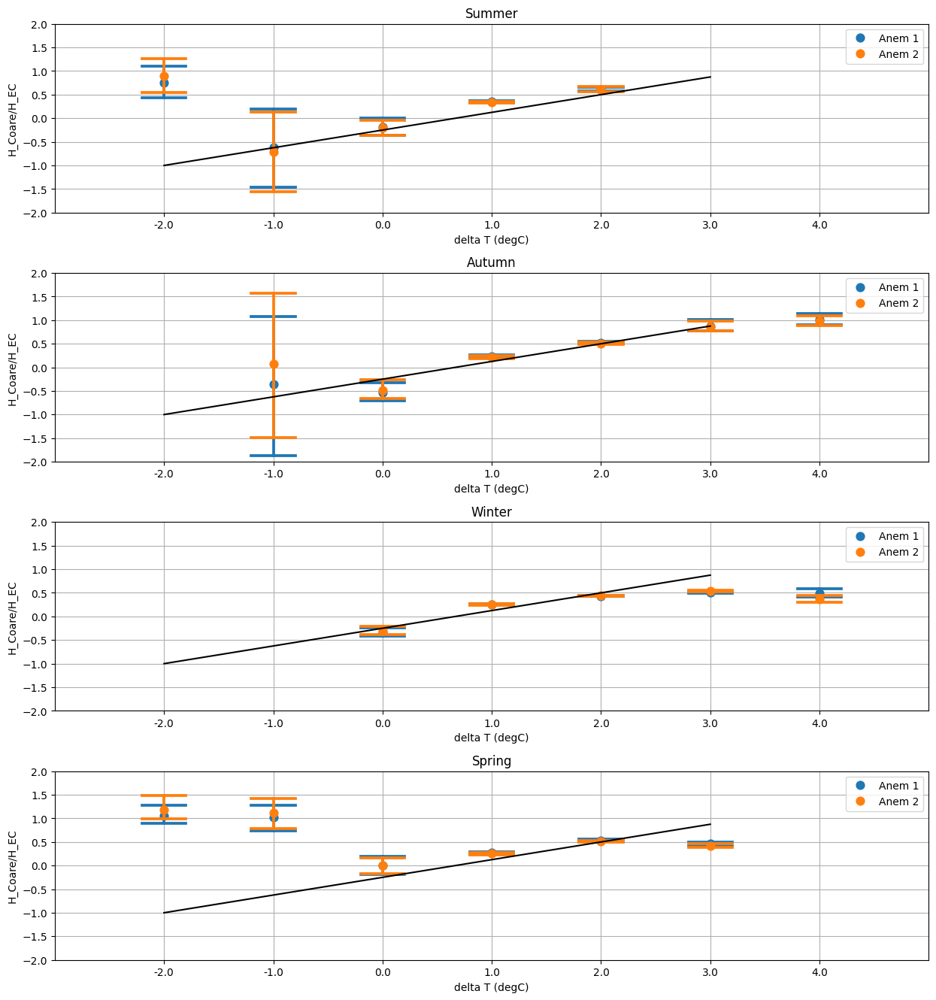

In [90]:
# Hc/Hec vs delta T
TRUE_TO_BIN = 2

logoutDf = outDf[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]
# logoutDf = logoutDf[(logoutDf.U_anem_1 >= 10)]

logoutDf = logoutDf[(logoutDf.U_anem_1 >= 5) & (logoutDf.U_anem_1 <= 15) & (logoutDf.U_anem_2 >= 5) & (logoutDf.U_anem_2 <= 15)]

fig, ax = plt.subplots(4, figsize=(15, 15))

season1 = (logoutDf.time < datetime.datetime(2015, 3, 1, 0, 0))
season2 = (logoutDf.time >= datetime.datetime(2015, 3, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 6, 1, 0, 0))
season3 = (logoutDf.time >= datetime.datetime(2015, 6, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 9, 1, 0, 0))
season4 = (logoutDf.time >= datetime.datetime(2015, 9, 1, 0, 0))

tempdiff = InterpolatedData(x=eraDf.timemet, y=eraDf.tsea - eraDf.ta)

for i, season in enumerate([season1, season2, season3, season4]):
    seasonDf = logoutDf[season]
    plot_errorbars(None, x=tempdiff.get_vals(seasonDf.time), y=seasonDf.HCoare_1/seasonDf.HApprox_1, binwidth=1, bin_lim=[-2, 4], capsize=.4, errorbar='ci', linestyle='none', label='Anem 1', ax=ax[i])
    plot_errorbars(None, x=tempdiff.get_vals(seasonDf.time), y=seasonDf.HCoare_2/seasonDf.HApprox_2, binwidth=1, bin_lim=[-2, 4],  capsize=.4, errorbar='ci', linestyle='none', label='Anem 2', ax=ax[i])
    
    error_coeff = [(0.375, -0.25), (0.375, -0.25), (0.375, -0.25), (0.375, -0.25)]
    x_vals = np.linspace(-2, 3, num=2)
    sns.lineplot(x=TRUE_TO_BIN+x_vals, y=error_coeff[i][0]*(x_vals) + error_coeff[i][1]*np.ones(2), ax=ax[i], color='k')

ax[0].set_title('Summer')
ax[1].set_title('Autumn')
ax[2].set_title('Winter')
ax[3].set_title('Spring')

y_offset = 0
y_offset_delta = -0.02
for axis in ax:
    axis.set_xlabel('delta T (degC)')
    axis.set_ylabel('H_Coare/H_EC')
    axis.set_ylim([-2, 2])
    axis.set_xlim([-3+TRUE_TO_BIN, 5+TRUE_TO_BIN])
    axis.grid()
    
    pos = axis.get_position()
    axis.set_position([pos.x0, pos.y0 + y_offset, pos.width, pos.height])
    y_offset += y_offset_delta

plt.show()

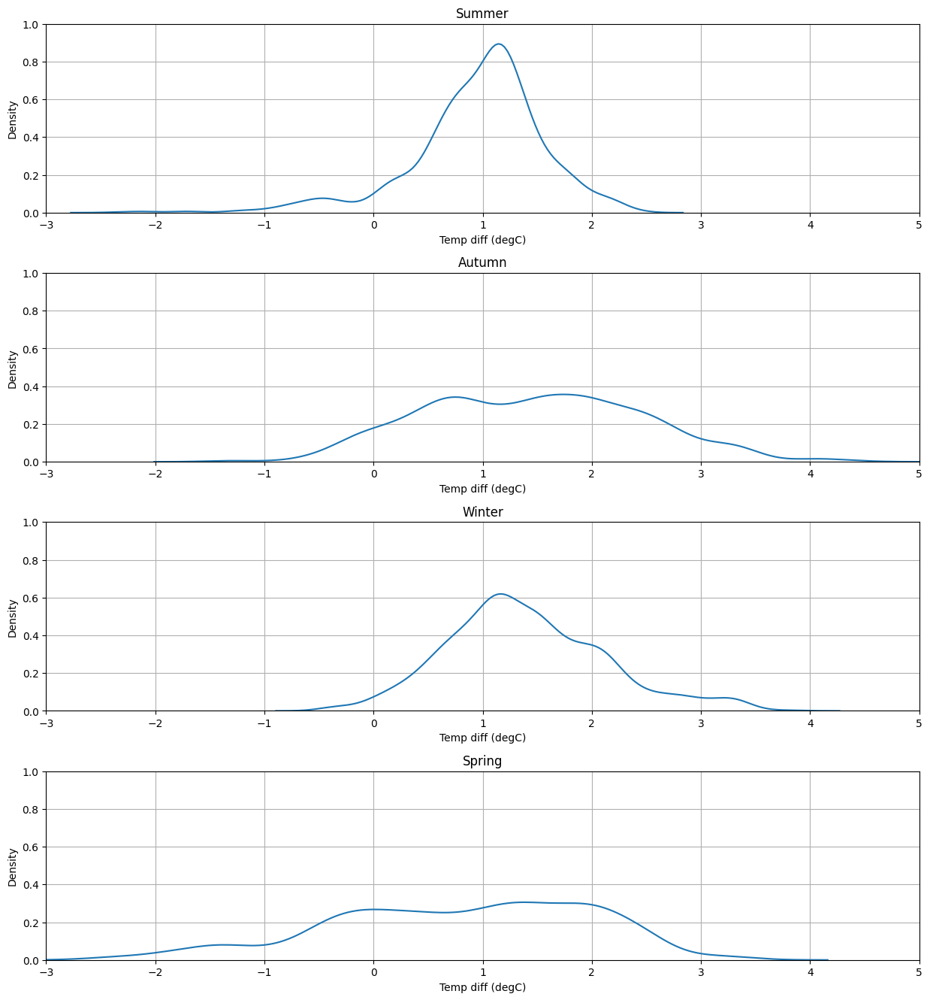

In [48]:
# delta T KDE
logoutDf = outDf[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]

logoutDf = logoutDf[(logoutDf.U_anem_1 >= 5) & (logoutDf.U_anem_1 <= 15) & (logoutDf.U_anem_2 >= 5) & (logoutDf.U_anem_2 <= 15)]

fig, ax = plt.subplots(4, figsize=(15, 15))

season1 = (logoutDf.time < datetime.datetime(2015, 3, 1, 0, 0))
season2 = (logoutDf.time >= datetime.datetime(2015, 3, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 6, 1, 0, 0))
season3 = (logoutDf.time >= datetime.datetime(2015, 6, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 9, 1, 0, 0))
season4 = (logoutDf.time >= datetime.datetime(2015, 9, 1, 0, 0))

tempdiff = InterpolatedData(x=eraDf.timemet, y=eraDf.tsea - eraDf.ta)

for i, season in enumerate([season1, season2, season3, season4]):
    seasonDf = logoutDf[season]
    sns.kdeplot(x=tempdiff.get_vals(seasonDf.time), ax=ax[i])
    
ax[0].set_title('Summer')
ax[1].set_title('Autumn')
ax[2].set_title('Winter')
ax[3].set_title('Spring')

y_offset = 0
y_offset_delta = -0.02
for axis in ax:
    axis.set_xlabel('Temp diff (degC)')
    axis.set_ylim([0, 1])
    axis.set_xlim([-3, 5])
    axis.grid()
    
    pos = axis.get_position()
    axis.set_position([pos.x0, pos.y0 + y_offset, pos.width, pos.height])
    y_offset += y_offset_delta

plt.show()

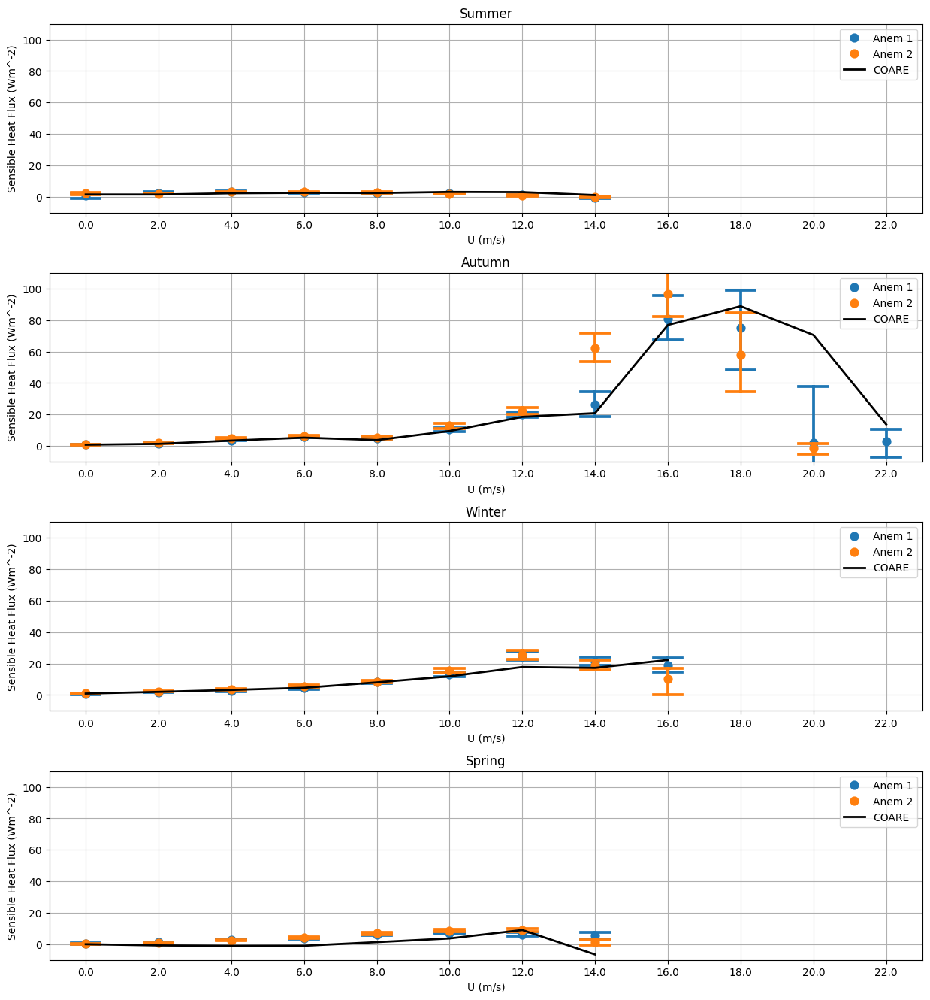

In [6]:
# Full year seasons with delta T

logoutDf = outDf#[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]

fig, ax = plt.subplots(4, figsize=(15, 15))

season1 = (logoutDf.time < datetime.datetime(2015, 3, 1, 0, 0))
season2 = (logoutDf.time >= datetime.datetime(2015, 3, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 6, 1, 0, 0))
season3 = (logoutDf.time >= datetime.datetime(2015, 6, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 9, 1, 0, 0))
season4 = (logoutDf.time >= datetime.datetime(2015, 9, 1, 0, 0))

tempdiff = InterpolatedData(x=eraDf.timemet, y=eraDf.tsea - eraDf.ta)

for i, season in enumerate([season1, season2, season3, season4]):
    seasonDf = logoutDf[season]
    seasonDf = seasonDf.copy(deep=True)

    deltaT = tempdiff.get_vals(seasonDf.time)
    seasonDf.HApprox_1 *= 0.375*deltaT + -0.25
    seasonDf.HApprox_2 *= 0.375*deltaT + -0.25
    
    plot_errorbars(seasonDf, x='U_anem_1', y='HApprox_1', binwidth=2, bin_lim=[0, 22], linestyle='none', capsize=.4, errorbar='ci', label='Anem 1', ax=ax[i])
    plot_errorbars(seasonDf, x='U_anem_2', y='HApprox_2', binwidth=2, bin_lim=[0, 22], linestyle='none',  capsize=.4, errorbar='ci', label='Anem 2', ax=ax[i])
    plot_errorbars(seasonDf, x='U_anem_1', y='HCoare_1', binwidth=2, bin_lim=[0, 22], errorbar=None, marker=None, linewidth=2, label='COARE', color='k', ax=ax[i])

ax[0].set_title('Summer')
ax[1].set_title('Autumn')
ax[2].set_title('Winter')
ax[3].set_title('Spring')

y_offset = 0
y_offset_delta = -0.02
for axis in ax:
    axis.set_xlabel('U (m/s)')
    axis.set_ylabel('Sensible Heat Flux (Wm^-2)')
    axis.set_ylim([-10, 110])
    axis.grid()
    
    pos = axis.get_position()
    axis.set_position([pos.x0, pos.y0 + y_offset, pos.width, pos.height])
    y_offset += y_offset_delta

plt.show()

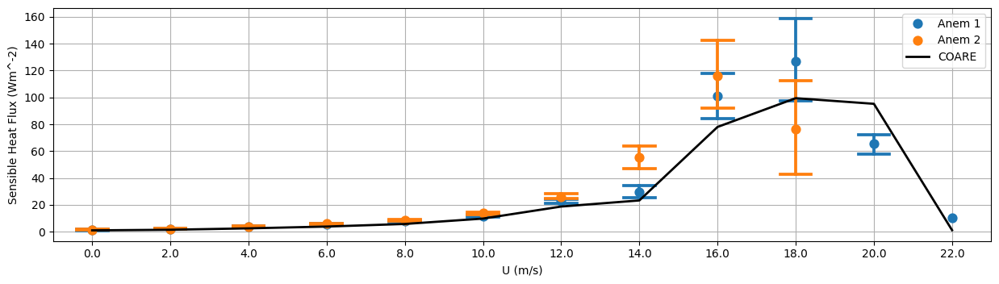

In [32]:
# Full year
logoutDf = outDf[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]
logoutDf = logoutDf.copy(deep=True)

tempdiff = InterpolatedData(x=eraDf.timemet, y=eraDf.tsea - eraDf.ta)
deltaT = tempdiff.get_vals(logoutDf.time)
logoutDf.HApprox_1 *= 0.375*deltaT + -0.25
logoutDf.HApprox_2 *= 0.375*deltaT + -0.25

fig, ax = plt.subplots(1, figsize=(15, 15/4))
plot_errorbars(logoutDf, x='U_anem_1', y='HApprox_1', binwidth=2, bin_lim=[0, 22], linestyle='none', capsize=.4, errorbar='ci', label='Anem 1', ax=ax)
plot_errorbars(logoutDf, x='U_anem_2', y='HApprox_2', binwidth=2, bin_lim=[0, 22], linestyle='none',  capsize=.4, errorbar='ci', label='Anem 2', ax=ax)
plot_errorbars(logoutDf, x='U_anem_1', y='HCoare_1', binwidth=2, bin_lim=[0, 22], errorbar=None, marker=None, linewidth=2, label='COARE', color='k', ax=ax)

ax.set_xlabel('U (m/s)')
ax.set_ylabel('Sensible Heat Flux (Wm^-2)')
# # plt.ylim([-300, 300])
ax.grid()
plt.show()

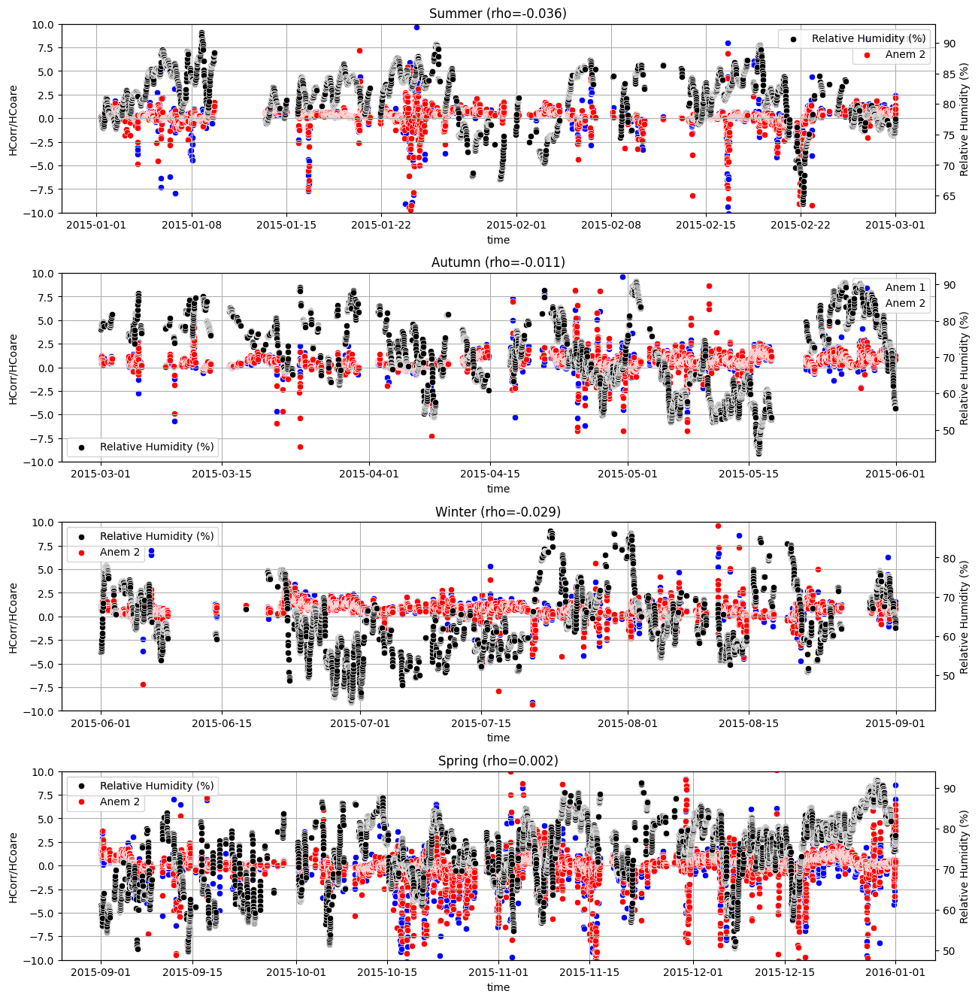

In [4]:
# Q correlation for deltaT correction over time
logoutDf = outDf#[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]
logoutDf = logoutDf[(logoutDf.U_anem_1 >= 5) & (logoutDf.U_anem_1 <= 15) & (logoutDf.U_anem_2 >= 5) & (logoutDf.U_anem_2 <= 15)]

fig, ax = plt.subplots(4, figsize=(15, 15))

season1 = (logoutDf.time < datetime.datetime(2015, 3, 1, 0, 0))
season2 = (logoutDf.time >= datetime.datetime(2015, 3, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 6, 1, 0, 0))
season3 = (logoutDf.time >= datetime.datetime(2015, 6, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 9, 1, 0, 0))
season4 = (logoutDf.time >= datetime.datetime(2015, 9, 1, 0, 0))

tempdiff = InterpolatedData(x=eraDf.timemet, y=eraDf.tsea - eraDf.ta)
hum = InterpolatedData(x=eraDf.timemet, y=eraDf.rh)

pearson_c = []

for i, season in enumerate([season1, season2, season3, season4]):
    seasonDf = logoutDf[season]
    seasonDf = seasonDf.copy(deep=True)
    
    deltaT = tempdiff.get_vals(seasonDf.time)
    seasonDf.HApprox_1 *= 0.375*deltaT + -0.25
    seasonDf.HApprox_2 *= 0.375*deltaT + -0.25
    
    twin = ax[i].twinx()
    sns.scatterplot(x=seasonDf.time, y=seasonDf.HApprox_1/seasonDf.HCoare_1, ax=ax[i], label='Anem 1', color='blue')
    sns.scatterplot(x=seasonDf.time, y=seasonDf.HApprox_2/seasonDf.HCoare_2, ax=ax[i], label='Anem 2', color='red')
    sns.scatterplot(x=seasonDf.time, y=hum.get_vals(seasonDf.time), ax=twin, label='Relative Humidity (%)', color='k')
    
    ax[i].set_ylabel('HCorr/HCoare')
    twin.set_ylabel('Relative Humidity (%)')
    
    logical = pd.notna(seasonDf.HApprox_1/seasonDf.HCoare_1)
    p_val = scipy.stats.pearsonr(hum.get_vals(seasonDf.time[logical]), seasonDf.HApprox_1[logical]/seasonDf.HCoare_1[logical])
    pearson_c.append(p_val.statistic)

ax[0].set_title(f'Summer (rho={round(pearson_c[0],3)})')
ax[1].set_title(f'Autumn (rho={round(pearson_c[1],3)})')
ax[2].set_title(f'Winter (rho={round(pearson_c[2],3)})')
ax[3].set_title(f'Spring (rho={round(pearson_c[3],3)})')

y_offset = 0
y_offset_delta = -0.02
for axis in ax:
    axis.set_ylim([-10, 10])
    axis.grid()
    
    pos = axis.get_position()
    axis.set_position([pos.x0, pos.y0 + y_offset, pos.width, pos.height])
    y_offset += y_offset_delta

plt.show()

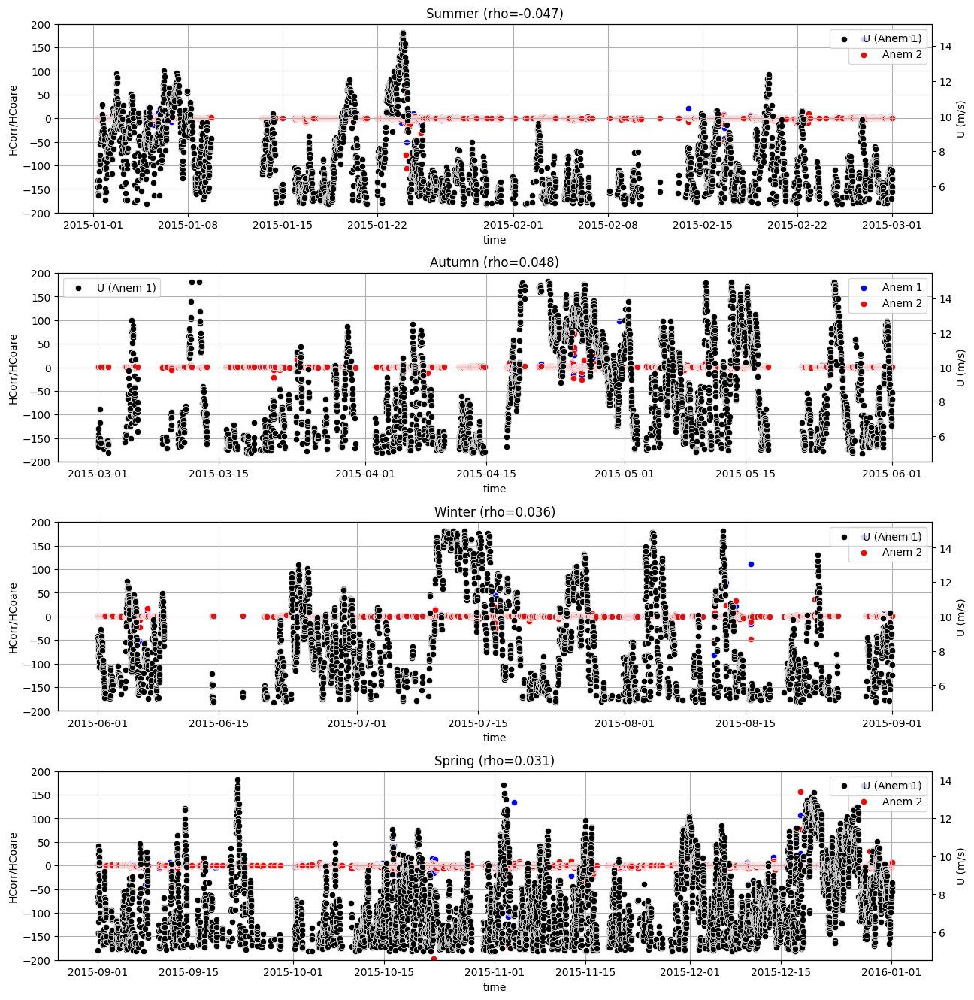

In [110]:
# U correlation for deltaT correction over time
logoutDf = outDf#[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]
logoutDf = logoutDf[(logoutDf.U_anem_1 >= 5) & (logoutDf.U_anem_1 <= 15) & (logoutDf.U_anem_2 >= 5) & (logoutDf.U_anem_2 <= 15)]

fig, ax = plt.subplots(4, figsize=(15, 15))

season1 = (logoutDf.time < datetime.datetime(2015, 3, 1, 0, 0))
season2 = (logoutDf.time >= datetime.datetime(2015, 3, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 6, 1, 0, 0))
season3 = (logoutDf.time >= datetime.datetime(2015, 6, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 9, 1, 0, 0))
season4 = (logoutDf.time >= datetime.datetime(2015, 9, 1, 0, 0))

tempdiff = InterpolatedData(x=eraDf.timemet, y=eraDf.tsea - eraDf.ta)

pearson_c = []

for i, season in enumerate([season1, season2, season3, season4]):
    seasonDf = logoutDf[season]
    seasonDf = seasonDf.copy(deep=True)
    
    deltaT = tempdiff.get_vals(seasonDf.time)
    seasonDf.HApprox_1 *= 0.375*deltaT + -0.25
    seasonDf.HApprox_2 *= 0.375*deltaT + -0.25
    
    twin = ax[i].twinx()
    sns.scatterplot(x=seasonDf.time, y=seasonDf.HApprox_1/seasonDf.HCoare_1, ax=ax[i], label='Anem 1', color='blue')
    sns.scatterplot(x=seasonDf.time, y=seasonDf.HApprox_2/seasonDf.HCoare_2, ax=ax[i], label='Anem 2', color='red')
    sns.scatterplot(x=seasonDf.time, y=seasonDf.U_anem_1, ax=twin, label='U (Anem 1)', color='k')
    
    ax[i].set_ylabel('HCorr/HCoare')
    twin.set_ylabel('U (m/s)')
    
    logical = pd.notna(seasonDf.HApprox_1/seasonDf.HCoare_1)
    p_val = scipy.stats.pearsonr(seasonDf.U_anem_1[logical], seasonDf.HApprox_1[logical]/seasonDf.HCoare_1[logical])
    pearson_c.append(p_val.statistic)

ax[0].set_title(f'Summer (rho={round(pearson_c[0],3)})')
ax[1].set_title(f'Autumn (rho={round(pearson_c[1],3)})')
ax[2].set_title(f'Winter (rho={round(pearson_c[2],3)})')
ax[3].set_title(f'Spring (rho={round(pearson_c[3],3)})')

y_offset = 0
y_offset_delta = -0.02
for axis in ax:
    axis.set_ylim([-200, 200])
    axis.grid()
    
    pos = axis.get_position()
    axis.set_position([pos.x0, pos.y0 + y_offset, pos.width, pos.height])
    y_offset += y_offset_delta

plt.show()

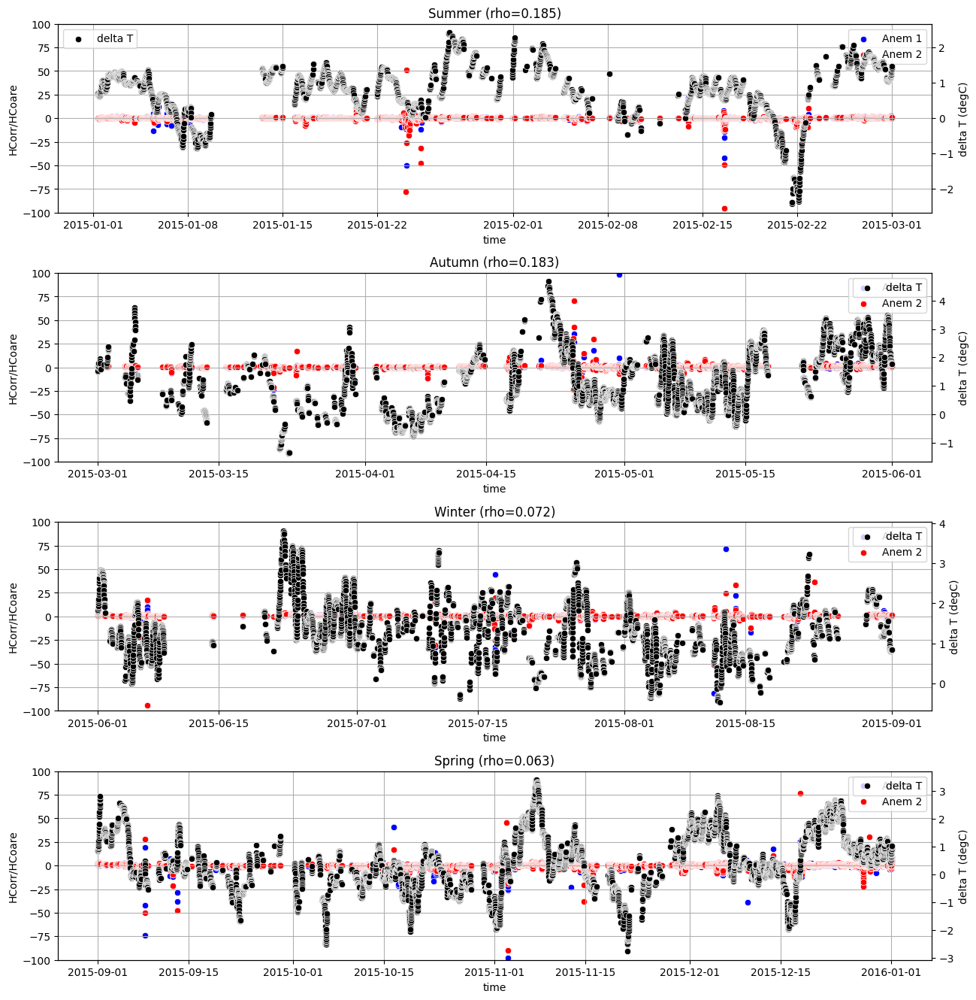

In [111]:
# deltaT correlation for deltaT correction over time
logoutDf = outDf#[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]
logoutDf = logoutDf[(logoutDf.U_anem_1 >= 5) & (logoutDf.U_anem_1 <= 15) & (logoutDf.U_anem_2 >= 5) & (logoutDf.U_anem_2 <= 15)]

fig, ax = plt.subplots(4, figsize=(15, 15))

season1 = (logoutDf.time < datetime.datetime(2015, 3, 1, 0, 0))
season2 = (logoutDf.time >= datetime.datetime(2015, 3, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 6, 1, 0, 0))
season3 = (logoutDf.time >= datetime.datetime(2015, 6, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 9, 1, 0, 0))
season4 = (logoutDf.time >= datetime.datetime(2015, 9, 1, 0, 0))

tempdiff = InterpolatedData(x=eraDf.timemet, y=eraDf.tsea - eraDf.ta)

pearson_c = []

for i, season in enumerate([season1, season2, season3, season4]):
    seasonDf = logoutDf[season]
    seasonDf = seasonDf.copy(deep=True)
    
    deltaT = tempdiff.get_vals(seasonDf.time)
    seasonDf.HApprox_1 *= 0.375*deltaT + -0.25
    seasonDf.HApprox_2 *= 0.375*deltaT + -0.25
    
    twin = ax[i].twinx()
    sns.scatterplot(x=seasonDf.time, y=seasonDf.HApprox_1/seasonDf.HCoare_1, ax=ax[i], label='Anem 1', color='blue')
    sns.scatterplot(x=seasonDf.time, y=seasonDf.HApprox_2/seasonDf.HCoare_2, ax=ax[i], label='Anem 2', color='red')
    sns.scatterplot(x=seasonDf.time, y=deltaT, ax=twin, label='delta T', color='k')
    
    ax[i].set_ylabel('HCorr/HCoare')
    twin.set_ylabel('delta T (degC)')
    
    logical = pd.notna(seasonDf.HApprox_1/seasonDf.HCoare_1)
    p_val = scipy.stats.pearsonr(deltaT[logical], seasonDf.HApprox_1[logical]/seasonDf.HCoare_1[logical])
    pearson_c.append(p_val.statistic)

ax[0].set_title(f'Summer (rho={round(pearson_c[0],3)})')
ax[1].set_title(f'Autumn (rho={round(pearson_c[1],3)})')
ax[2].set_title(f'Winter (rho={round(pearson_c[2],3)})')
ax[3].set_title(f'Spring (rho={round(pearson_c[3],3)})')

y_offset = 0
y_offset_delta = -0.02
for axis in ax:
    axis.set_ylim([-100, 100])
    axis.grid()
    
    pos = axis.get_position()
    axis.set_position([pos.x0, pos.y0 + y_offset, pos.width, pos.height])
    y_offset += y_offset_delta

plt.show()

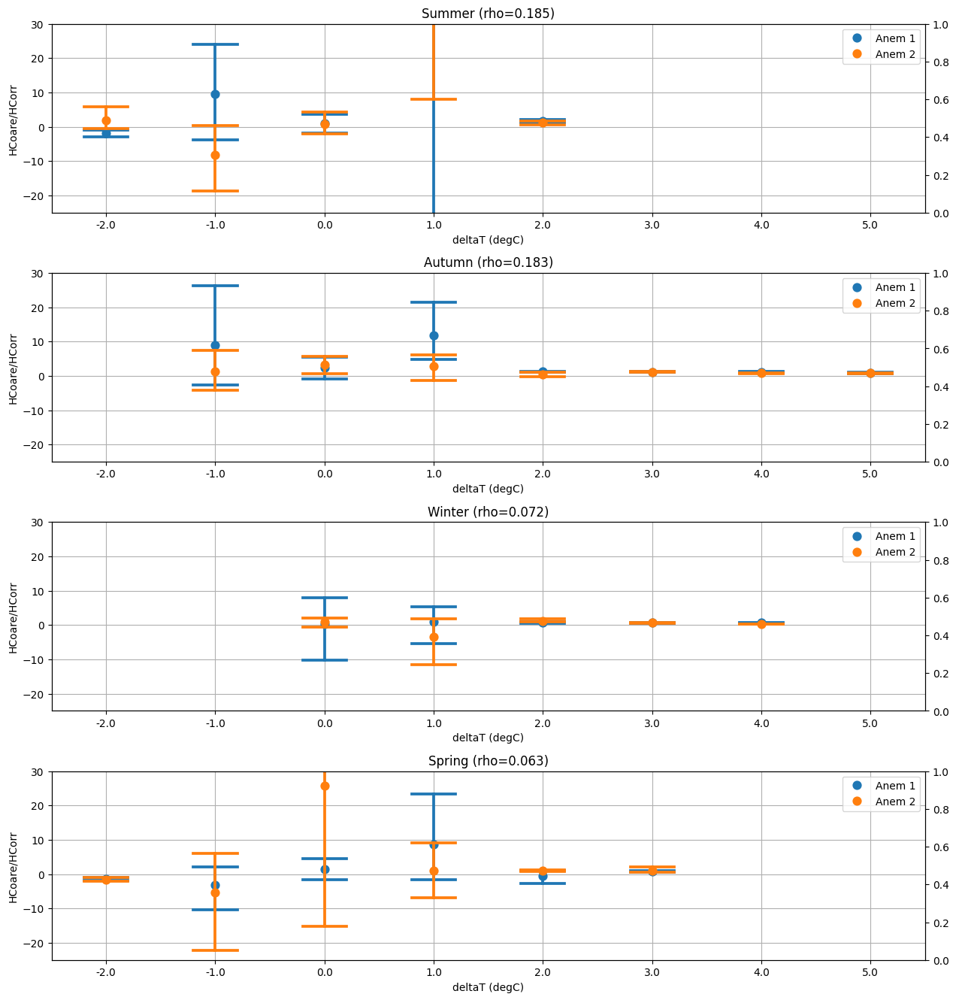

In [112]:
# deltaT correlation for deltaT correction over time
logoutDf = outDf#[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]
logoutDf = logoutDf[(logoutDf.U_anem_1 >= 5) & (logoutDf.U_anem_1 <= 15) & (logoutDf.U_anem_2 >= 5) & (logoutDf.U_anem_2 <= 15)]

fig, ax = plt.subplots(4, figsize=(15, 15))

season1 = (logoutDf.time < datetime.datetime(2015, 3, 1, 0, 0))
season2 = (logoutDf.time >= datetime.datetime(2015, 3, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 6, 1, 0, 0))
season3 = (logoutDf.time >= datetime.datetime(2015, 6, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 9, 1, 0, 0))
season4 = (logoutDf.time >= datetime.datetime(2015, 9, 1, 0, 0))

tempdiff = InterpolatedData(x=eraDf.timemet, y=eraDf.tsea - eraDf.ta)

pearson_c = []

for i, season in enumerate([season1, season2, season3, season4]):
    seasonDf = logoutDf[season]
    seasonDf = seasonDf.copy(deep=True)
    
    deltaT = tempdiff.get_vals(seasonDf.time)
    seasonDf.HApprox_1 *= 0.375*deltaT + -0.25
    seasonDf.HApprox_2 *= 0.375*deltaT + -0.25
    
    twin = ax[i].twinx()
    plot_errorbars(None, x=deltaT, y=seasonDf.HCoare_1/seasonDf.HApprox_1, binwidth=1, bin_lim=[-2, 5], capsize=.4, errorbar='ci', linestyle='none', label='Anem 1', ax=ax[i])
    plot_errorbars(None, x=deltaT, y=seasonDf.HCoare_2/seasonDf.HApprox_2, binwidth=1, bin_lim=[-2, 5], capsize=.4, errorbar='ci', linestyle='none', label='Anem 2', ax=ax[i])
    
    ax[i].set_ylabel('HCoare/HCorr')
    ax[i].set_xlabel('deltaT (degC)')
    
    logical = pd.notna(seasonDf.HApprox_1/seasonDf.HCoare_1)
    p_val = scipy.stats.pearsonr(deltaT[logical], seasonDf.HApprox_1[logical]/seasonDf.HCoare_1[logical])
    pearson_c.append(p_val.statistic)

ax[0].set_title(f'Summer (rho={round(pearson_c[0],3)})')
ax[1].set_title(f'Autumn (rho={round(pearson_c[1],3)})')
ax[2].set_title(f'Winter (rho={round(pearson_c[2],3)})')
ax[3].set_title(f'Spring (rho={round(pearson_c[3],3)})')

y_offset = 0
y_offset_delta = -0.02
for axis in ax:
    axis.set_ylim([-25, 30])
    axis.grid()
    
    pos = axis.get_position()
    axis.set_position([pos.x0, pos.y0 + y_offset, pos.width, pos.height])
    y_offset += y_offset_delta

plt.show()

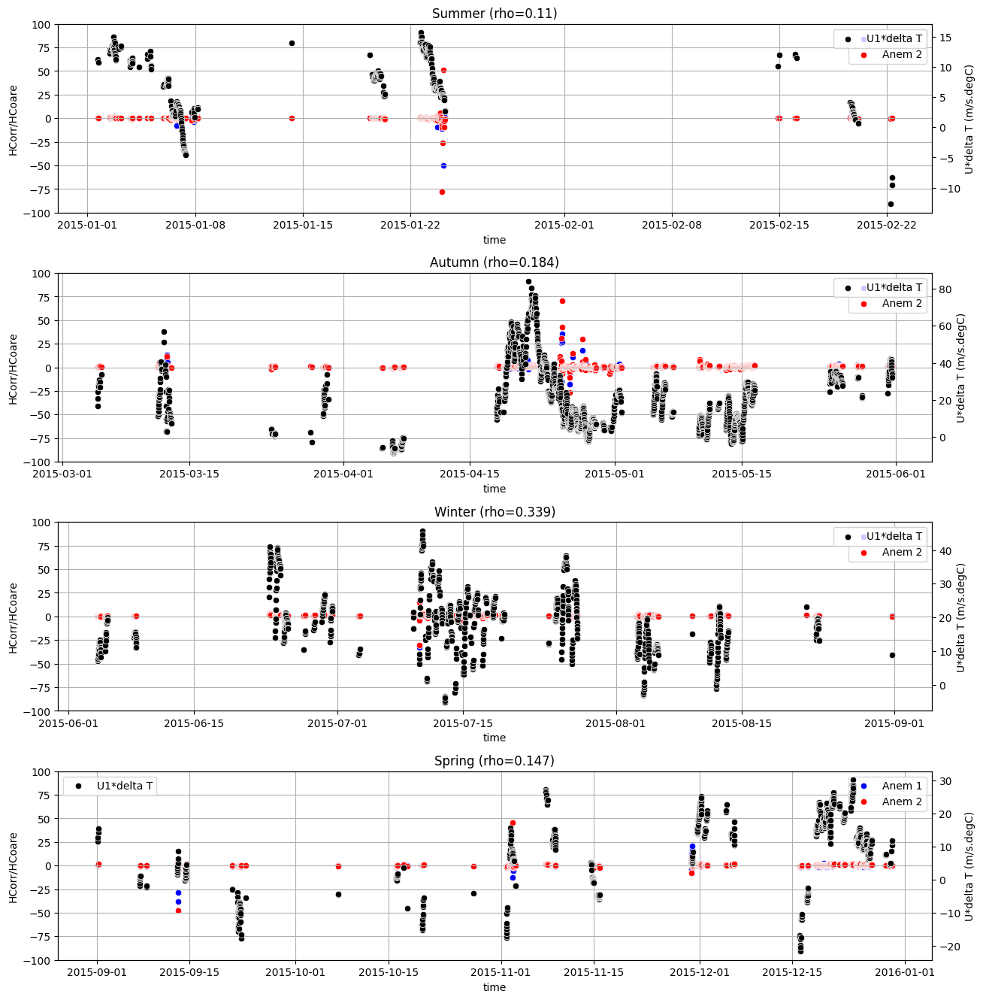

In [83]:
# U*deltaT correlation for deltaT correction over time
logoutDf = outDf#[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]
logoutDf = logoutDf[(logoutDf.U_anem_1 >= 10)]

fig, ax = plt.subplots(4, figsize=(15, 15))

season1 = (logoutDf.time < datetime.datetime(2015, 3, 1, 0, 0))
season2 = (logoutDf.time >= datetime.datetime(2015, 3, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 6, 1, 0, 0))
season3 = (logoutDf.time >= datetime.datetime(2015, 6, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 9, 1, 0, 0))
season4 = (logoutDf.time >= datetime.datetime(2015, 9, 1, 0, 0))

tempdiff = InterpolatedData(x=eraDf.timemet, y=eraDf.tsea - eraDf.ta)

pearson_c = []

for i, season in enumerate([season1, season2, season3, season4]):
    seasonDf = logoutDf[season]
    seasonDf = seasonDf.copy(deep=True)
    
    deltaT = tempdiff.get_vals(seasonDf.time)
    seasonDf.HApprox_1 *= 0.375*deltaT + -0.25
    seasonDf.HApprox_2 *= 0.375*deltaT + -0.25
    
    twin = ax[i].twinx()
    sns.scatterplot(x=seasonDf.time, y=seasonDf.HApprox_1/seasonDf.HCoare_1, ax=ax[i], label='Anem 1', color='blue')
    sns.scatterplot(x=seasonDf.time, y=seasonDf.HApprox_2/seasonDf.HCoare_2, ax=ax[i], label='Anem 2', color='red')
    sns.scatterplot(x=seasonDf.time, y=seasonDf.U_anem_1*deltaT, ax=twin, label='U1*delta T', color='k')
    
    ax[i].set_ylabel('HCorr/HCoare')
    twin.set_ylabel('U*delta T (m/s.degC)')
    
    logical = pd.notna(seasonDf.HApprox_1/seasonDf.HCoare_1)
    p_val = scipy.stats.pearsonr(deltaT[logical]*seasonDf.U_anem_1[logical], seasonDf.HApprox_1[logical]/seasonDf.HCoare_1[logical])
    pearson_c.append(p_val.statistic)

ax[0].set_title(f'Summer (rho={round(pearson_c[0],3)})')
ax[1].set_title(f'Autumn (rho={round(pearson_c[1],3)})')
ax[2].set_title(f'Winter (rho={round(pearson_c[2],3)})')
ax[3].set_title(f'Spring (rho={round(pearson_c[3],3)})')

y_offset = 0
y_offset_delta = -0.02
for axis in ax:
    axis.set_ylim([-100, 100])
    axis.grid()
    
    pos = axis.get_position()
    axis.set_position([pos.x0, pos.y0 + y_offset, pos.width, pos.height])
    y_offset += y_offset_delta

plt.show()

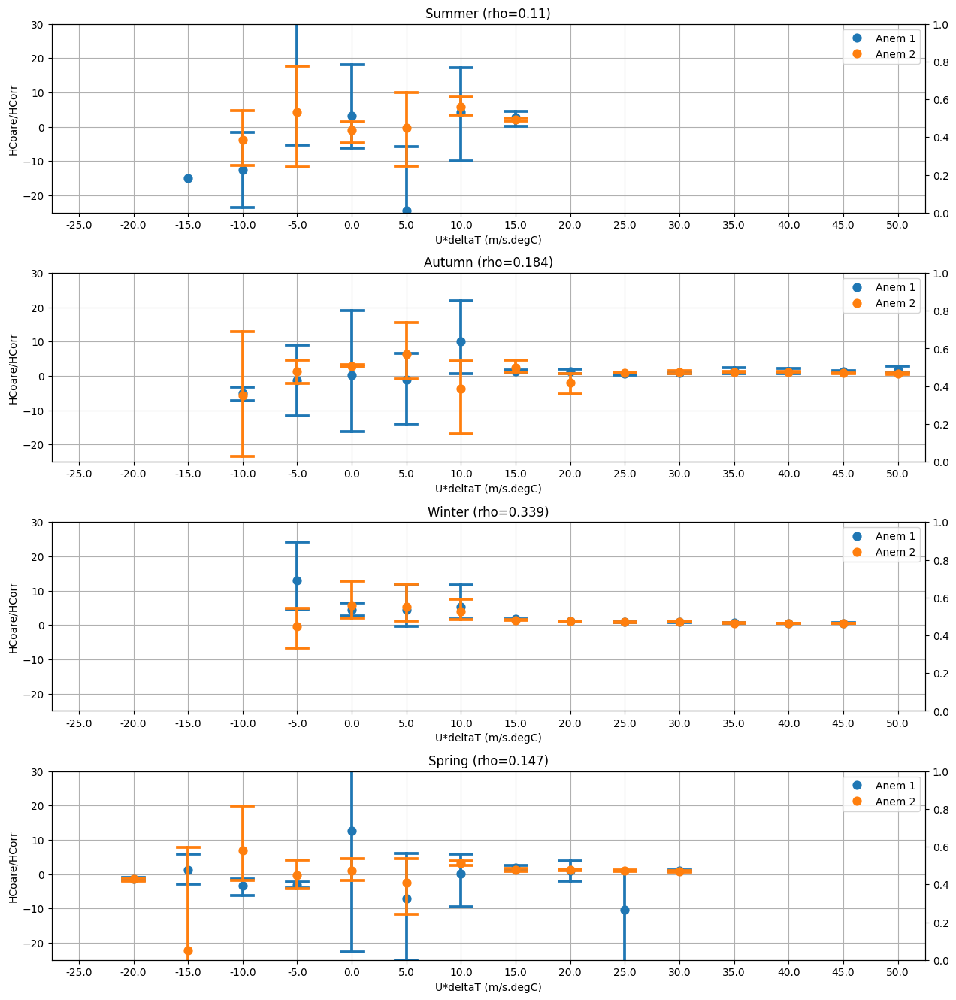

In [101]:
# U*deltaT correlation for deltaT correction over time
logoutDf = outDf#[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]
logoutDf = logoutDf[(logoutDf.U_anem_1 >= 10)]

fig, ax = plt.subplots(4, figsize=(15, 15))

season1 = (logoutDf.time < datetime.datetime(2015, 3, 1, 0, 0))
season2 = (logoutDf.time >= datetime.datetime(2015, 3, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 6, 1, 0, 0))
season3 = (logoutDf.time >= datetime.datetime(2015, 6, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 9, 1, 0, 0))
season4 = (logoutDf.time >= datetime.datetime(2015, 9, 1, 0, 0))

tempdiff = InterpolatedData(x=eraDf.timemet, y=eraDf.tsea - eraDf.ta)

pearson_c = []

for i, season in enumerate([season1, season2, season3, season4]):
    seasonDf = logoutDf[season]
    seasonDf = seasonDf.copy(deep=True)
    
    deltaT = tempdiff.get_vals(seasonDf.time)
    seasonDf.HApprox_1 *= 0.375*deltaT + -0.25
    seasonDf.HApprox_2 *= 0.375*deltaT + -0.25
    
    twin = ax[i].twinx()
    plot_errorbars(None, x=seasonDf.U_anem_1*deltaT, y=seasonDf.HCoare_1/seasonDf.HApprox_1, binwidth=5, bin_lim=[-25, 50], capsize=.4, errorbar='ci', linestyle='none', label='Anem 1', ax=ax[i])
    plot_errorbars(None, x=seasonDf.U_anem_2*deltaT, y=seasonDf.HCoare_2/seasonDf.HApprox_2, binwidth=5, bin_lim=[-25, 50], capsize=.4, errorbar='ci', linestyle='none', label='Anem 2', ax=ax[i])
    
    ax[i].set_ylabel('HCoare/HCorr')
    ax[i].set_xlabel('U*deltaT (m/s.degC)')
    
    logical = pd.notna(seasonDf.HCoare_1/seasonDf.HApprox_1)
    p_val = scipy.stats.pearsonr(seasonDf.U_anem_1[logical]*deltaT[logical], seasonDf.HApprox_1[logical]/seasonDf.HCoare_1[logical])
    pearson_c.append(p_val.statistic)

ax[0].set_title(f'Summer (rho={round(pearson_c[0],3)})')
ax[1].set_title(f'Autumn (rho={round(pearson_c[1],3)})')
ax[2].set_title(f'Winter (rho={round(pearson_c[2],3)})')
ax[3].set_title(f'Spring (rho={round(pearson_c[3],3)})')

y_offset = 0
y_offset_delta = -0.02
for axis in ax:
    axis.set_ylim([-25, 30])
    axis.grid()
    
    pos = axis.get_position()
    axis.set_position([pos.x0, pos.y0 + y_offset, pos.width, pos.height])
    y_offset += y_offset_delta

plt.show()

In [87]:
x_1 = np.array([-5, 0, 5, 10, 15])
y_1 = np.array([-0.75, -0.125, 0.25, 0.5, 0.6])

x_2 = np.array([-5, 0, 5, 10, 15, 20, 25, 30, 35])
y_2 = np.array([-1, 0.5, 0.2, 0.4, 0.6, 0.5, 0.55, 0.7, 0.7])

x_3 = np.array([0, 5, 10, 15, 20, 25, 30, 35, 40, 45])
y_3 = np.array([0.4, 0.15, 0.3, 0.4, 0.45, 0.5, 0.5, 0.55, 0.5, 0.5])

x_4 = np.array([0, 5, 10, 15, 20, 25, 30])
y_4 = np.array([0, 0.1, 0.35, 0.5, 0.55, 0.6, 0.65])

x = np.concatenate((x_1, x_2, x_3, x_4))
y = np.concatenate((y_1, y_2, y_3, y_4))

scipy.optimize.curve_fit(lambda t,a,b,c: a*np.exp(b*t)+c,  x_1,  y_1, bounds=([-2, -2, -1], [0, 0, 1]))

(array([-0.92733922, -0.10394059,  0.8072361 ]),
 array([[ 2.70670697e-03, -3.27855890e-04, -2.15532134e-03],
        [-3.27855890e-04,  4.33720480e-05,  2.61921530e-04],
        [-2.15532134e-03,  2.61921530e-04,  1.78045726e-03]]))

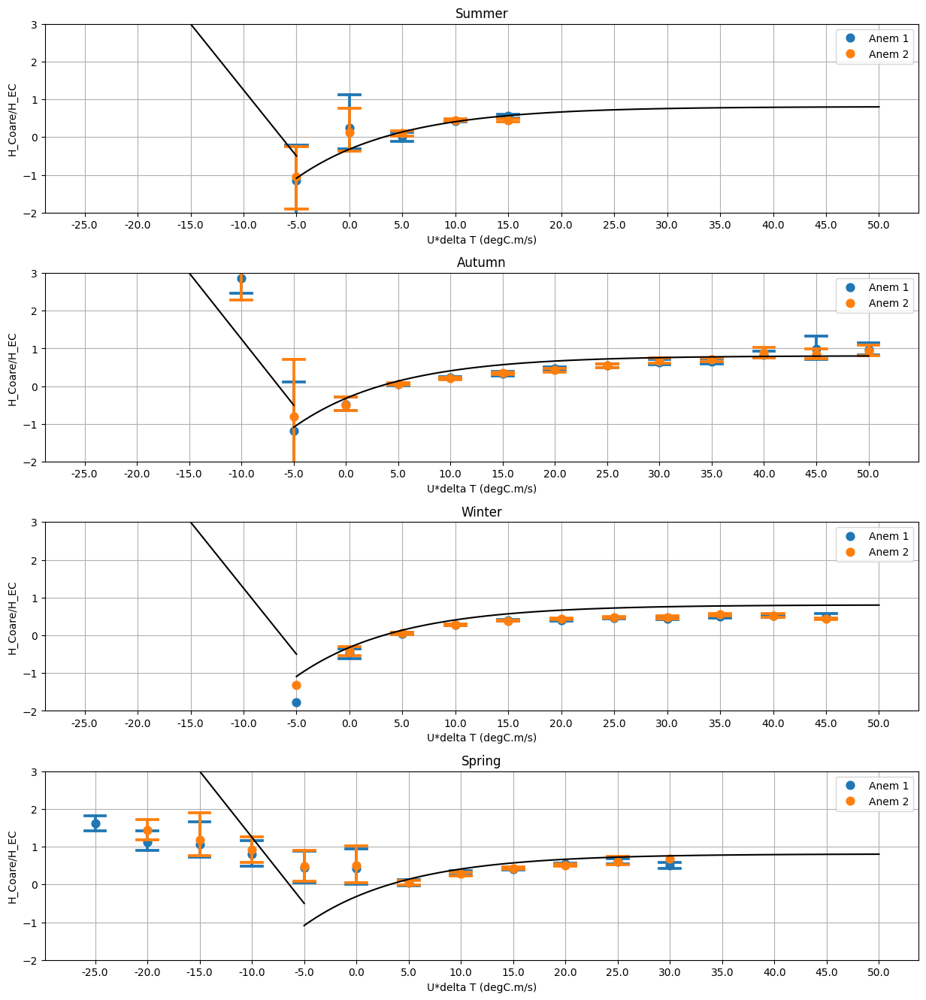

In [7]:
# Hc/Hec vs U*delta T
TRUE_TO_BIN = 5

logoutDf = outDf[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]

logoutDf = logoutDf[(logoutDf.U_anem_1 >= 8) & (logoutDf.U_anem_1 <= 15) & (logoutDf.U_anem_2 >= 8) & (logoutDf.U_anem_2 <= 15)]

fig, ax = plt.subplots(4, figsize=(15, 15))

season1 = (logoutDf.time < datetime.datetime(2015, 3, 1, 0, 0))
season2 = (logoutDf.time >= datetime.datetime(2015, 3, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 6, 1, 0, 0))
season3 = (logoutDf.time >= datetime.datetime(2015, 6, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 9, 1, 0, 0))
season4 = (logoutDf.time >= datetime.datetime(2015, 9, 1, 0, 0))

tempdiff = InterpolatedData(x=eraDf.timemet, y=eraDf.tsea - eraDf.ta)

for i, season in enumerate([season1, season2, season3, season4]):
    seasonDf = logoutDf[season]
    plot_errorbars(None, x=tempdiff.get_vals(seasonDf.time)*seasonDf.U_anem_1, y=seasonDf.HCoare_1/seasonDf.HApprox_1, binwidth=5, bin_lim=[-25,50], capsize=.4, errorbar='ci', linestyle='none', label='Anem 1', ax=ax[i])
    plot_errorbars(None, x=tempdiff.get_vals(seasonDf.time)*seasonDf.U_anem_2, y=seasonDf.HCoare_2/seasonDf.HApprox_2, binwidth=5, bin_lim=[-25,50],  capsize=.4, errorbar='ci', linestyle='none', label='Anem 2', ax=ax[i])
    
    error_const = 4*[(-1.12733922, -0.10394059,  0.8072361)]
#     error_const = [(-0.92733921, -0.10394059,  0.80723609), (-0.92733921, -0.10394059,  0.80723609), 
#                    (-0.92733921, -0.10394059,  0.80723609), (-0.92733921, -0.10394059,  0.80723609)]
    x_vals = np.linspace(-5, 50, num=100)
    sns.lineplot(x=(x_vals/TRUE_TO_BIN+TRUE_TO_BIN), y=error_const[i][0]*np.exp(error_const[i][1]*x_vals) + error_const[i][2]*np.ones(len(x_vals)),
                 ax=ax[i], color='k')
    
    x_vals_2 = np.linspace(-25, -5, num=2)
    error_const = 4*[(-0.35,-2.25)]
    sns.lineplot(x=(x_vals_2/TRUE_TO_BIN+TRUE_TO_BIN), y=error_const[i][0]*x_vals_2 + error_const[i][1]*np.ones(len(x_vals_2)),
                 ax=ax[i], color='k')

ax[0].set_title('Summer')
ax[1].set_title('Autumn')
ax[2].set_title('Winter')
ax[3].set_title('Spring')

y_offset = 0
y_offset_delta = -0.02
for axis in ax:
    axis.set_xlabel('U*delta T (degC.m/s)')
    axis.set_ylabel('H_Coare/H_EC')
    axis.set_ylim([-2, 3])
#     axis.set_xlim([-25/TRUE_TO_BIN+TRUE_TO_BIN, 50/TRUE_TO_BIN+TRUE_TO_BIN])
    
    pos = axis.get_position()
    axis.set_position([pos.x0, pos.y0 + y_offset, pos.width, pos.height])
    y_offset += y_offset_delta
#     axis.tick_params(axis='x', labelrotation=90)
    axis.grid()

plt.show()

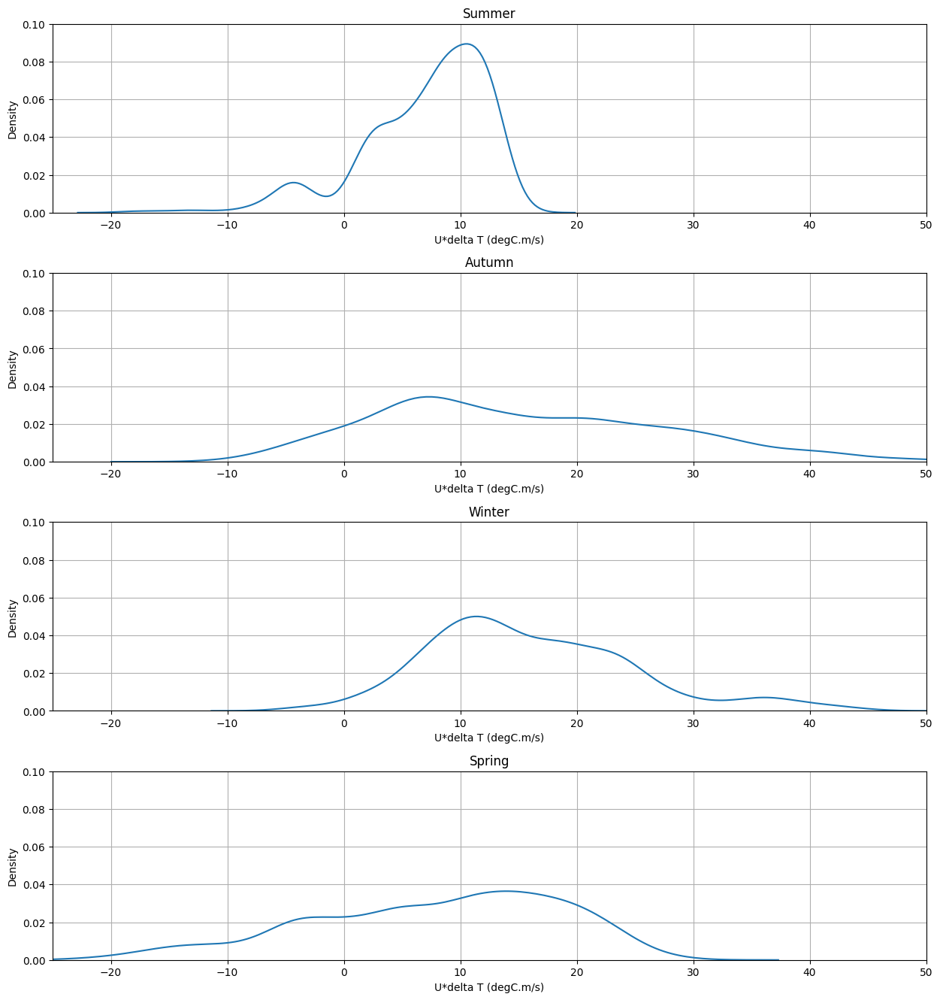

In [8]:
# U*delta T KDE
logoutDf = outDf#[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]

logoutDf = logoutDf[(logoutDf.U_anem_1 >= 8) & (logoutDf.U_anem_1 <= 15) & (logoutDf.U_anem_2 >= 8) & (logoutDf.U_anem_2 <= 15)]
fig, ax = plt.subplots(4, figsize=(15, 15))

season1 = (logoutDf.time < datetime.datetime(2015, 3, 1, 0, 0))
season2 = (logoutDf.time >= datetime.datetime(2015, 3, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 6, 1, 0, 0))
season3 = (logoutDf.time >= datetime.datetime(2015, 6, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 9, 1, 0, 0))
season4 = (logoutDf.time >= datetime.datetime(2015, 9, 1, 0, 0))

tempdiff = InterpolatedData(x=eraDf.timemet, y=eraDf.tsea - eraDf.ta)

for i, season in enumerate([season1, season2, season3, season4]):
    seasonDf = logoutDf[season]
    sns.kdeplot(x=tempdiff.get_vals(seasonDf.time)*seasonDf.U_anem_1, ax=ax[i])
    
ax[0].set_title('Summer')
ax[1].set_title('Autumn')
ax[2].set_title('Winter')
ax[3].set_title('Spring')

y_offset = 0
y_offset_delta = -0.02
for axis in ax:
    axis.set_xlabel('U*delta T (degC.m/s)')
    axis.set_ylim([0, 0.1])
    axis.set_xlim([-25, 50])
    axis.grid()
    
    pos = axis.get_position()
    axis.set_position([pos.x0, pos.y0 + y_offset, pos.width, pos.height])
    y_offset += y_offset_delta

plt.show()

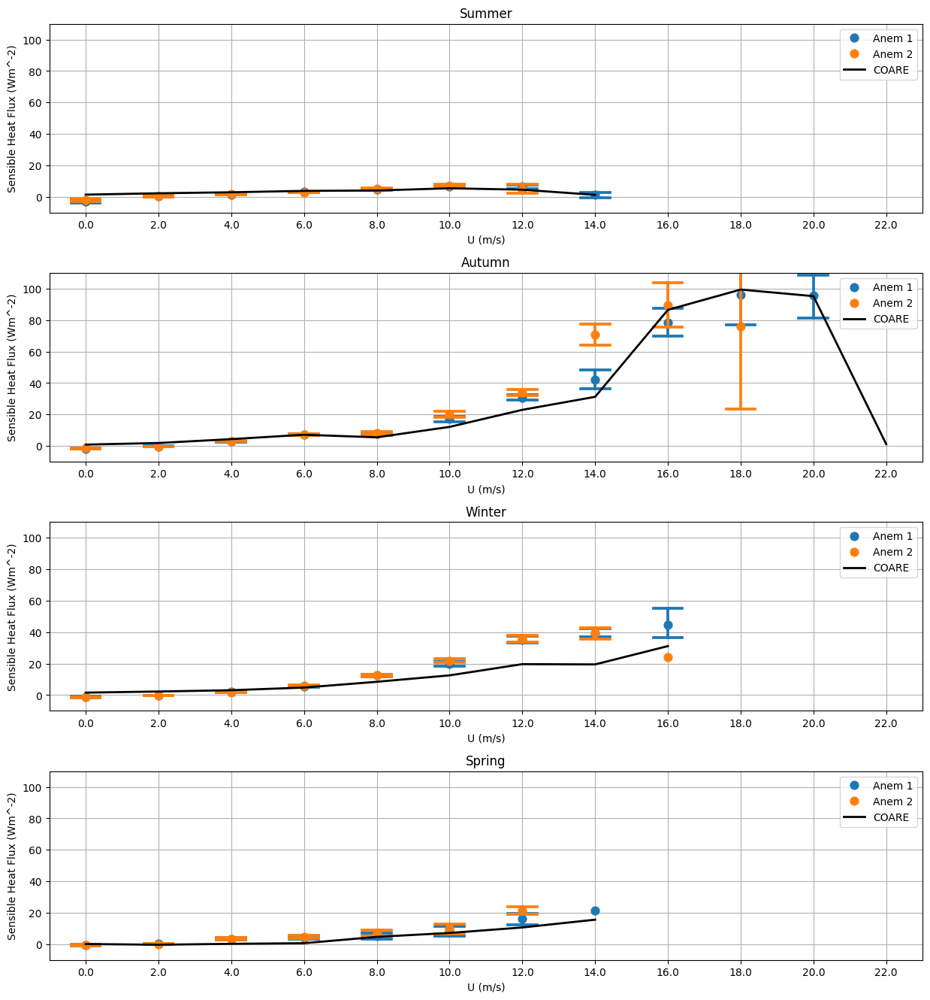

In [27]:
# Full year seasons with U*delta T
def exp_lin(x):
    if x >= -5:
        return -1.12733921*np.exp(-0.10394059*x) + 0.80723609
    return -0.35*x + -2.25

logoutDf = outDf[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]

fig, ax = plt.subplots(4, figsize=(15, 15))

season1 = (logoutDf.time < datetime.datetime(2015, 3, 1, 0, 0))
season2 = (logoutDf.time >= datetime.datetime(2015, 3, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 6, 1, 0, 0))
season3 = (logoutDf.time >= datetime.datetime(2015, 6, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 9, 1, 0, 0))
season4 = (logoutDf.time >= datetime.datetime(2015, 9, 1, 0, 0))

tempdiff = InterpolatedData(x=eraDf.timemet, y=eraDf.tsea - eraDf.ta)

for i, season in enumerate([season1, season2, season3, season4]):
    seasonDf = logoutDf[season]
    seasonDf = seasonDf.copy(deep=True)
    
    for j, row in seasonDf.iterrows():
        deltaT = tempdiff.get_vals(pd.Series(row.time))

        seasonDf.at[j, 'HApprox_1'] *= exp_lin(deltaT[0]*row.U_anem_1)
        seasonDf.at[j, 'HApprox_2'] *= exp_lin(deltaT[0]*row.U_anem_2)
    
    plot_errorbars(seasonDf, x='U_anem_1', y='HApprox_1', binwidth=2, bin_lim=[0, 22], linestyle='none', capsize=.4, errorbar='ci', label='Anem 1', ax=ax[i])
    plot_errorbars(seasonDf, x='U_anem_2', y='HApprox_2', binwidth=2, bin_lim=[0, 22], linestyle='none',  capsize=.4, errorbar='ci', label='Anem 2', ax=ax[i])
    plot_errorbars(seasonDf, x='U_anem_1', y='HCoare_1', binwidth=2, bin_lim=[0, 22], errorbar=None, marker=None, linewidth=2, label='COARE', color='k', ax=ax[i])

ax[0].set_title('Summer')
ax[1].set_title('Autumn')
ax[2].set_title('Winter')
ax[3].set_title('Spring')

y_offset = 0
y_offset_delta = -0.02
for axis in ax:
    axis.set_xlabel('U (m/s)')
    axis.set_ylabel('Sensible Heat Flux (Wm^-2)')
    axis.set_ylim([-10, 110])
    axis.grid()
    
    pos = axis.get_position()
    axis.set_position([pos.x0, pos.y0 + y_offset, pos.width, pos.height])
    y_offset += y_offset_delta

plt.show()

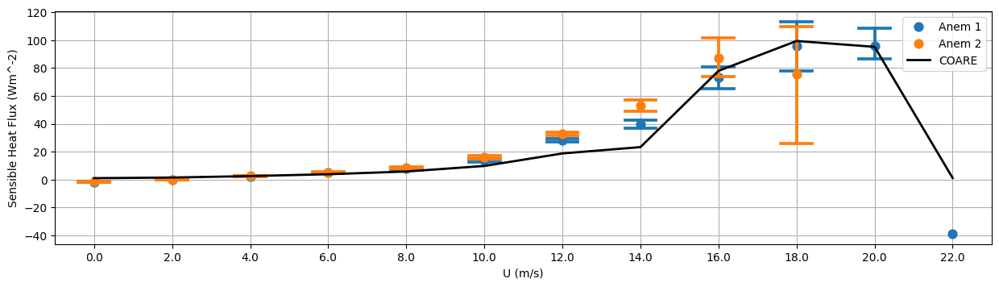

In [28]:
# Full year
def exp_lin(x):
    if x >= -5:
        return -1.12733921*np.exp(-0.10394059*x) + 0.80723609
    return -0.35*x + -2.25

logoutDf = outDf[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]
logoutDf = logoutDf.copy(deep=True)

tempdiff = InterpolatedData(x=eraDf.timemet, y=eraDf.tsea - eraDf.ta)

for i, row in logoutDf.iterrows():
    deltaT = tempdiff.get_vals(pd.Series(row.time))

    logoutDf.at[i, 'HApprox_1'] *= exp_lin(deltaT[0]*row.U_anem_1)
    logoutDf.at[i, 'HApprox_2'] *= exp_lin(deltaT[0]*row.U_anem_2)

fig, ax = plt.subplots(1, figsize=(15, 15/4))
plot_errorbars(logoutDf, x='U_anem_1', y='HApprox_1', binwidth=2, bin_lim=[0, 22], linestyle='none', capsize=.4, errorbar='ci', label='Anem 1', ax=ax)
plot_errorbars(logoutDf, x='U_anem_2', y='HApprox_2', binwidth=2, bin_lim=[0, 22], linestyle='none',  capsize=.4, errorbar='ci', label='Anem 2', ax=ax)
plot_errorbars(logoutDf, x='U_anem_1', y='HCoare_1', binwidth=2, bin_lim=[0, 22], errorbar=None, marker=None, linewidth=2, label='COARE', color='k', ax=ax)

ax.set_xlabel('U (m/s)')
ax.set_ylabel('Sensible Heat Flux (Wm^-2)')
# plt.ylim([-300, 300])
ax.grid()
plt.show()

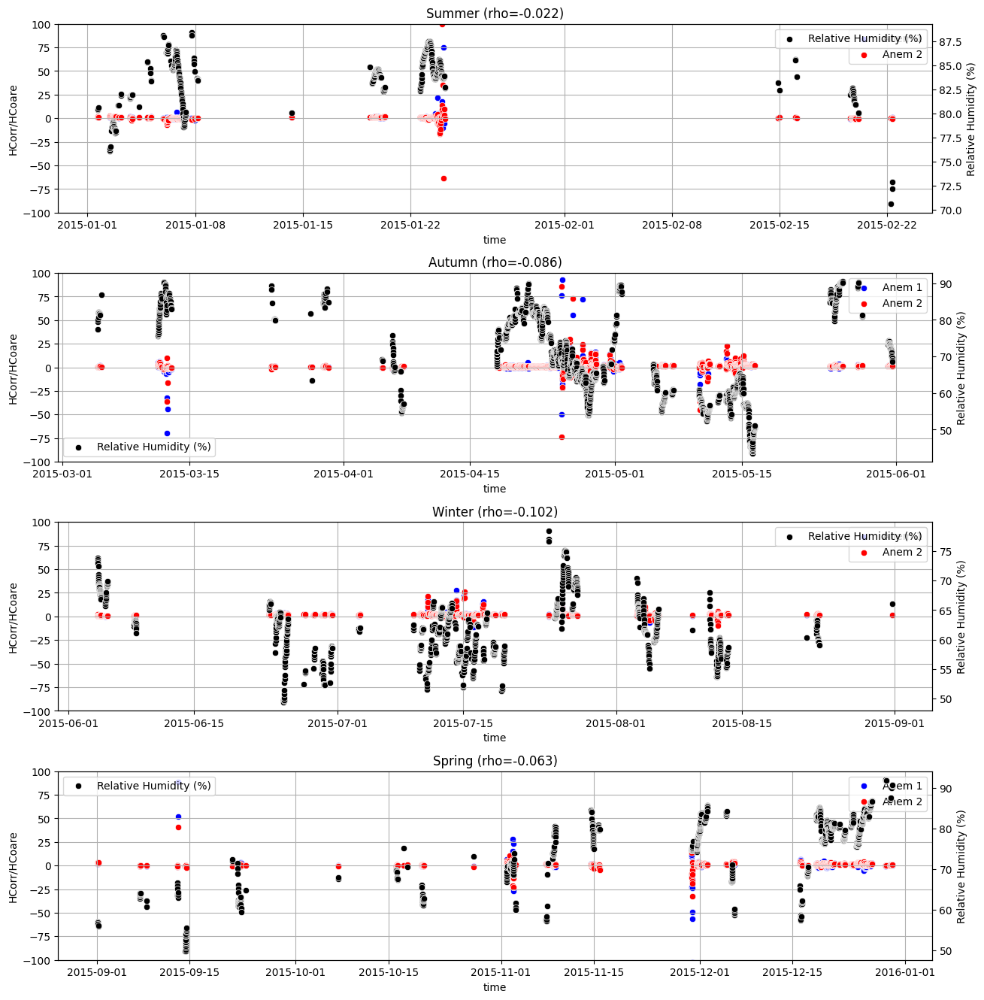

In [77]:
# Q correlation for U*deltaT correction over time
def exp_lin(x):
    if x >= -5:
        return -1.12733921*np.exp(-0.10394059*x) + 0.80723609
    return -0.35*x + -2.25

logoutDf = outDf#[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]
logoutDf = logoutDf[(logoutDf.U_anem_1 >= 10)]

fig, ax = plt.subplots(4, figsize=(15, 15))

season1 = (logoutDf.time < datetime.datetime(2015, 3, 1, 0, 0))
season2 = (logoutDf.time >= datetime.datetime(2015, 3, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 6, 1, 0, 0))
season3 = (logoutDf.time >= datetime.datetime(2015, 6, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 9, 1, 0, 0))
season4 = (logoutDf.time >= datetime.datetime(2015, 9, 1, 0, 0))

tempdiff = InterpolatedData(x=eraDf.timemet, y=eraDf.tsea - eraDf.ta)
hum = InterpolatedData(x=eraDf.timemet, y=eraDf.rh)

pearson_c = []

for i, season in enumerate([season1, season2, season3, season4]):
    seasonDf = logoutDf[season]
    seasonDf = seasonDf.copy(deep=True)
    
    for j, row in seasonDf.iterrows():
        deltaT = tempdiff.get_vals(pd.Series(row.time))

        seasonDf.at[j, 'HApprox_1'] *= exp_lin(deltaT[0]*row.U_anem_1)
        seasonDf.at[j, 'HApprox_2'] *= exp_lin(deltaT[0]*row.U_anem_2)
    
    twin = ax[i].twinx()
    sns.scatterplot(x=seasonDf.time, y=seasonDf.HApprox_1/seasonDf.HCoare_1, ax=ax[i], label='Anem 1', color='blue')
    sns.scatterplot(x=seasonDf.time, y=seasonDf.HApprox_2/seasonDf.HCoare_2, ax=ax[i], label='Anem 2', color='red')
    sns.scatterplot(x=seasonDf.time, y=hum.get_vals(seasonDf.time), ax=twin, label='Relative Humidity (%)', color='k')
    
    ax[i].set_ylabel('HCorr/HCoare')
    twin.set_ylabel('Relative Humidity (%)')
    
    logical = pd.notna(seasonDf.HApprox_1/seasonDf.HCoare_1)
    p_val = scipy.stats.pearsonr(hum.get_vals(seasonDf.time[logical]), seasonDf.HApprox_1[logical]/seasonDf.HCoare_1[logical])
    pearson_c.append(p_val.statistic)

ax[0].set_title(f'Summer (rho={round(pearson_c[0],3)})')
ax[1].set_title(f'Autumn (rho={round(pearson_c[1],3)})')
ax[2].set_title(f'Winter (rho={round(pearson_c[2],3)})')
ax[3].set_title(f'Spring (rho={round(pearson_c[3],3)})')

y_offset = 0
y_offset_delta = -0.02
for axis in ax:
    axis.set_ylim([-100, 100])
    axis.grid()
    
    pos = axis.get_position()
    axis.set_position([pos.x0, pos.y0 + y_offset, pos.width, pos.height])
    y_offset += y_offset_delta

plt.show()

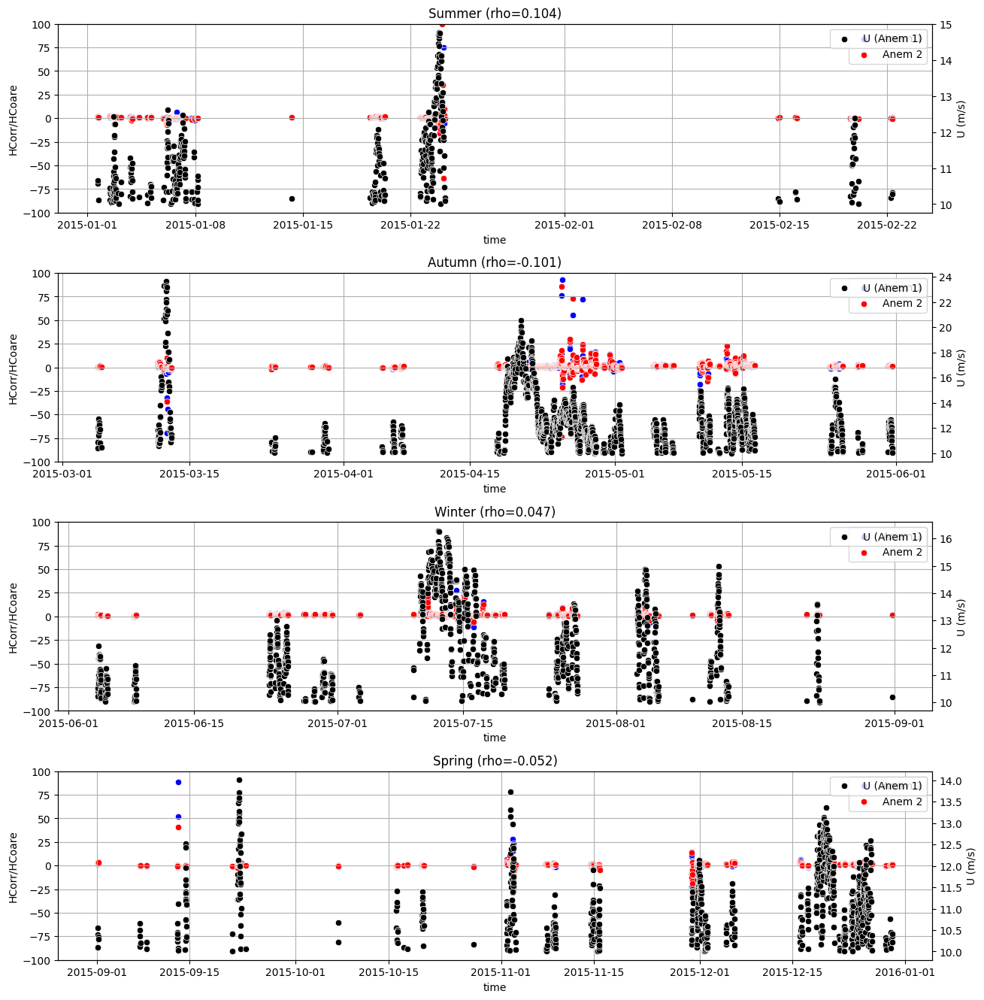

In [88]:
# U correlation for U*deltaT correction over time
def exp_lin(x):
    if x >= -5:
        return -1.12733921*np.exp(-0.10394059*x) + 0.80723609
    return -0.35*x + -2.25

logoutDf = outDf#[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]
logoutDf = logoutDf[(logoutDf.U_anem_1 >= 10)]

fig, ax = plt.subplots(4, figsize=(15, 15))

season1 = (logoutDf.time < datetime.datetime(2015, 3, 1, 0, 0))
season2 = (logoutDf.time >= datetime.datetime(2015, 3, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 6, 1, 0, 0))
season3 = (logoutDf.time >= datetime.datetime(2015, 6, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 9, 1, 0, 0))
season4 = (logoutDf.time >= datetime.datetime(2015, 9, 1, 0, 0))

tempdiff = InterpolatedData(x=eraDf.timemet, y=eraDf.tsea - eraDf.ta)

pearson_c = []

for i, season in enumerate([season1, season2, season3, season4]):
    seasonDf = logoutDf[season]
    seasonDf = seasonDf.copy(deep=True)
    
    for j, row in seasonDf.iterrows():
        deltaT = tempdiff.get_vals(pd.Series(row.time))

        seasonDf.at[j, 'HApprox_1'] *= exp_lin(deltaT[0]*row.U_anem_1)
        seasonDf.at[j, 'HApprox_2'] *= exp_lin(deltaT[0]*row.U_anem_2)
    
    twin = ax[i].twinx()
    sns.scatterplot(x=seasonDf.time, y=seasonDf.HApprox_1/seasonDf.HCoare_1, ax=ax[i], label='Anem 1', color='blue')
    sns.scatterplot(x=seasonDf.time, y=seasonDf.HApprox_2/seasonDf.HCoare_2, ax=ax[i], label='Anem 2', color='red')
    sns.scatterplot(x=seasonDf.time, y=seasonDf.U_anem_1, ax=twin, label='U (Anem 1)', color='k')
    
    ax[i].set_ylabel('HCorr/HCoare')
    twin.set_ylabel('U (m/s)')
    
    logical = pd.notna(seasonDf.HApprox_1/seasonDf.HCoare_1)
    p_val = scipy.stats.pearsonr(seasonDf.U_anem_1[logical], seasonDf.HApprox_1[logical]/seasonDf.HCoare_1[logical])
    pearson_c.append(p_val.statistic)

ax[0].set_title(f'Summer (rho={round(pearson_c[0],3)})')
ax[1].set_title(f'Autumn (rho={round(pearson_c[1],3)})')
ax[2].set_title(f'Winter (rho={round(pearson_c[2],3)})')
ax[3].set_title(f'Spring (rho={round(pearson_c[3],3)})')

y_offset = 0
y_offset_delta = -0.02
for axis in ax:
    axis.set_ylim([-100, 100])
    axis.grid()
    
    pos = axis.get_position()
    axis.set_position([pos.x0, pos.y0 + y_offset, pos.width, pos.height])
    y_offset += y_offset_delta

plt.show()

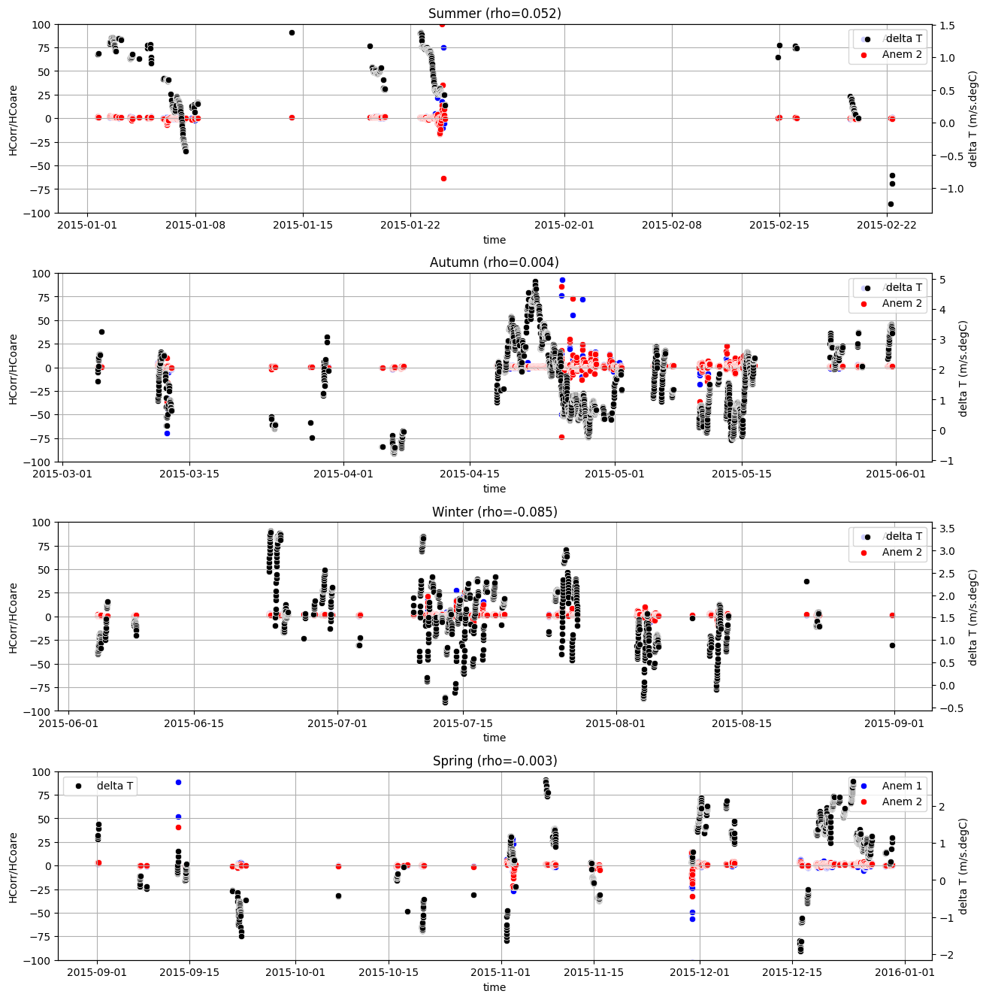

In [78]:
# deltaT correlation for U*deltaT correction over time
def exp_lin(x):
    if x >= -5:
        return -1.12733921*np.exp(-0.10394059*x) + 0.80723609
    return -0.35*x + -2.25

logoutDf = outDf#[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]
logoutDf = logoutDf[(logoutDf.U_anem_1 >= 10)]

fig, ax = plt.subplots(4, figsize=(15, 15))

season1 = (logoutDf.time < datetime.datetime(2015, 3, 1, 0, 0))
season2 = (logoutDf.time >= datetime.datetime(2015, 3, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 6, 1, 0, 0))
season3 = (logoutDf.time >= datetime.datetime(2015, 6, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 9, 1, 0, 0))
season4 = (logoutDf.time >= datetime.datetime(2015, 9, 1, 0, 0))

tempdiff = InterpolatedData(x=eraDf.timemet, y=eraDf.tsea - eraDf.ta)
hum = InterpolatedData(x=eraDf.timemet, y=eraDf.rh)

pearson_c = []

for i, season in enumerate([season1, season2, season3, season4]):
    seasonDf = logoutDf[season]
    seasonDf = seasonDf.copy(deep=True)
    
    for j, row in seasonDf.iterrows():
        deltaT = tempdiff.get_vals(pd.Series(row.time))

        seasonDf.at[j, 'HApprox_1'] *= exp_lin(deltaT[0]*row.U_anem_1)
        seasonDf.at[j, 'HApprox_2'] *= exp_lin(deltaT[0]*row.U_anem_2)
    
    deltaT = tempdiff.get_vals(seasonDf.time)
    
    twin = ax[i].twinx()
    sns.scatterplot(x=seasonDf.time, y=seasonDf.HApprox_1/seasonDf.HCoare_1, ax=ax[i], label='Anem 1', color='blue')
    sns.scatterplot(x=seasonDf.time, y=seasonDf.HApprox_2/seasonDf.HCoare_2, ax=ax[i], label='Anem 2', color='red')
    sns.scatterplot(x=seasonDf.time, y=deltaT, ax=twin, label='delta T', color='k')
    
    ax[i].set_ylabel('HCorr/HCoare')
    twin.set_ylabel('delta T (m/s.degC)')
    
    logical = pd.notna(seasonDf.HApprox_1/seasonDf.HCoare_1)
    p_val = scipy.stats.pearsonr(deltaT[logical], seasonDf.HApprox_1[logical]/seasonDf.HCoare_1[logical])
    pearson_c.append(p_val.statistic)

ax[0].set_title(f'Summer (rho={round(pearson_c[0],3)})')
ax[1].set_title(f'Autumn (rho={round(pearson_c[1],3)})')
ax[2].set_title(f'Winter (rho={round(pearson_c[2],3)})')
ax[3].set_title(f'Spring (rho={round(pearson_c[3],3)})')

y_offset = 0
y_offset_delta = -0.02
for axis in ax:
    axis.set_ylim([-100, 100])
    axis.grid()
    
    pos = axis.get_position()
    axis.set_position([pos.x0, pos.y0 + y_offset, pos.width, pos.height])
    y_offset += y_offset_delta

plt.show()

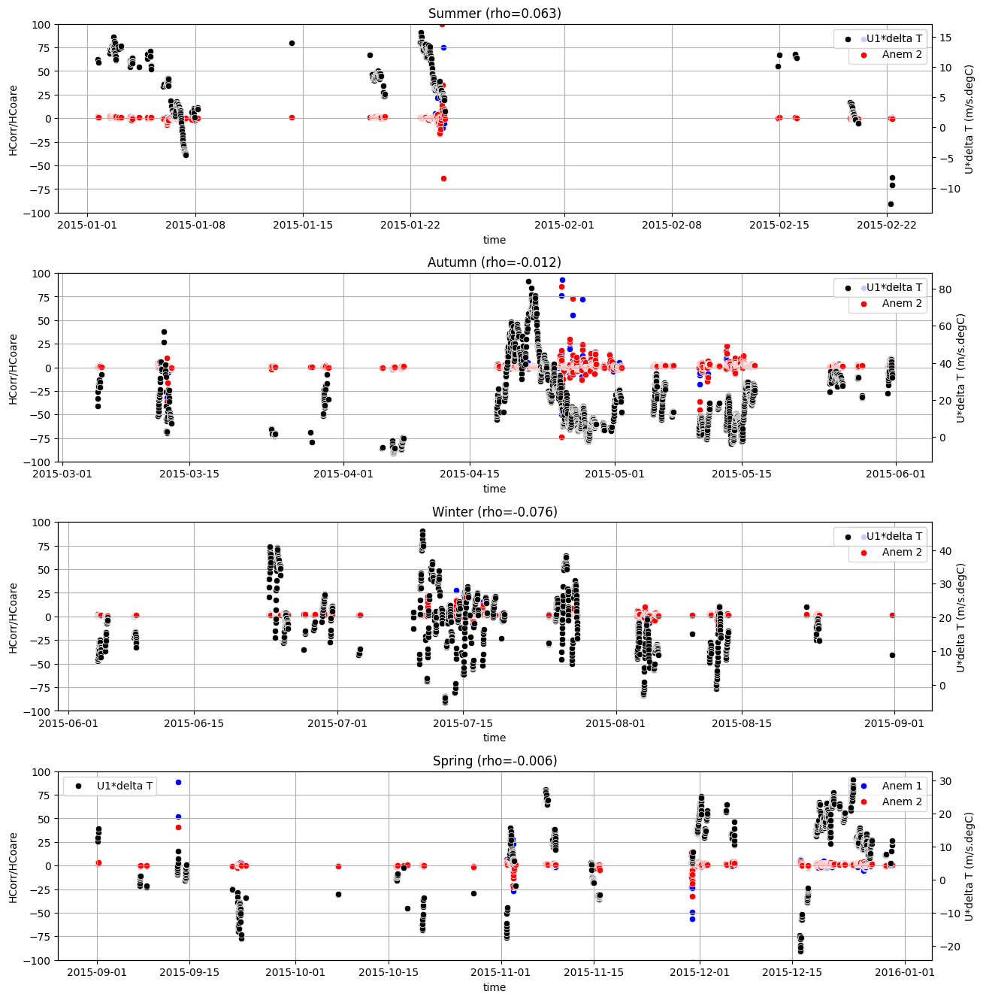

In [79]:
# U*deltaT correlation for U*deltaT correction over time
def exp_lin(x):
    if x >= -5:
        return -1.12733921*np.exp(-0.10394059*x) + 0.80723609
    return -0.35*x + -2.25

logoutDf = outDf#[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]
logoutDf = logoutDf[(logoutDf.U_anem_1 >= 10)]

fig, ax = plt.subplots(4, figsize=(15, 15))

season1 = (logoutDf.time < datetime.datetime(2015, 3, 1, 0, 0))
season2 = (logoutDf.time >= datetime.datetime(2015, 3, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 6, 1, 0, 0))
season3 = (logoutDf.time >= datetime.datetime(2015, 6, 1, 0, 0)) & (logoutDf.time < datetime.datetime(2015, 9, 1, 0, 0))
season4 = (logoutDf.time >= datetime.datetime(2015, 9, 1, 0, 0))

tempdiff = InterpolatedData(x=eraDf.timemet, y=eraDf.tsea - eraDf.ta)

pearson_c = []

for i, season in enumerate([season1, season2, season3, season4]):
    seasonDf = logoutDf[season]
    seasonDf = seasonDf.copy(deep=True)
    
    for j, row in seasonDf.iterrows():
        deltaT = tempdiff.get_vals(pd.Series(row.time))

        seasonDf.at[j, 'HApprox_1'] *= exp_lin(deltaT[0]*row.U_anem_1)
        seasonDf.at[j, 'HApprox_2'] *= exp_lin(deltaT[0]*row.U_anem_2)
    
    deltaT = tempdiff.get_vals(seasonDf.time)
    
    twin = ax[i].twinx()
    sns.scatterplot(x=seasonDf.time, y=seasonDf.HApprox_1/seasonDf.HCoare_1, ax=ax[i], label='Anem 1', color='blue')
    sns.scatterplot(x=seasonDf.time, y=seasonDf.HApprox_2/seasonDf.HCoare_2, ax=ax[i], label='Anem 2', color='red')
    sns.scatterplot(x=seasonDf.time, y=seasonDf.U_anem_1*deltaT, ax=twin, label='U1*delta T', color='k')
    
    ax[i].set_ylabel('HCorr/HCoare')
    twin.set_ylabel('U*delta T (m/s.degC)')
    
    logical = pd.notna(seasonDf.HApprox_1/seasonDf.HCoare_1)
    p_val = scipy.stats.pearsonr(deltaT[logical]*seasonDf.U_anem_1[logical], seasonDf.HApprox_1[logical]/seasonDf.HCoare_1[logical])
    pearson_c.append(p_val.statistic)

ax[0].set_title(f'Summer (rho={round(pearson_c[0],3)})')
ax[1].set_title(f'Autumn (rho={round(pearson_c[1],3)})')
ax[2].set_title(f'Winter (rho={round(pearson_c[2],3)})')
ax[3].set_title(f'Spring (rho={round(pearson_c[3],3)})')

y_offset = 0
y_offset_delta = -0.02
for axis in ax:
    axis.set_ylim([-100, 100])
    axis.grid()
    
    pos = axis.get_position()
    axis.set_position([pos.x0, pos.y0 + y_offset, pos.width, pos.height])
    y_offset += y_offset_delta

plt.show()

/tmp/ipykernel_7007/773584948.py:15: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  ax.figure.colorbar(sm)


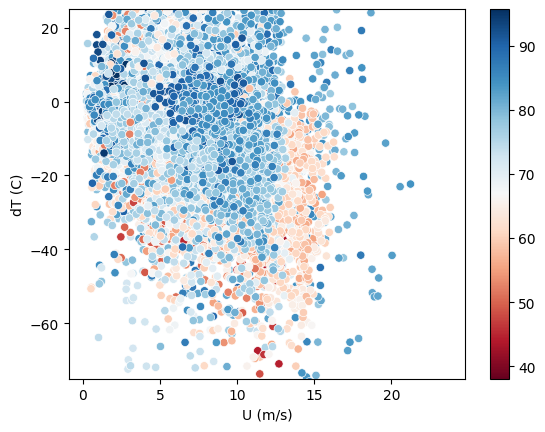

In [28]:
logDf = outDf.copy(deep=True)#[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]
logeraDf = eraDf

h_diff = np.abs(logDf.HApprox_1 - logDf.HCoare_1)
hum = InterpolatedData(x=logeraDf.timemet, y=logeraDf.rh)

logDf['hum'] = hum.get_vals(logDf.time)
tempdiff = InterpolatedData(x=logeraDf.timemet, y=logeraDf.tsea - logeraDf.ta)
ax = sns.scatterplot(x=logDf.U_anem_1, y=logDf.HCoare_1-logDf.HApprox_1, palette='RdBu', hue=logDf.hum)

norm = plt.Normalize(logDf.hum.min(), logDf.hum.max())
sm = plt.cm.ScalarMappable(cmap="RdBu", norm=norm)
sm.set_array([])
ax.get_legend().remove()
ax.figure.colorbar(sm)

ax.set_ylim([-75, 25])
ax.set_xlabel('U (m/s)')
ax.set_ylabel('dT (C)')
plt.show()

/tmp/ipykernel_2878/288237799.py:14: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  ax.figure.colorbar(sm)


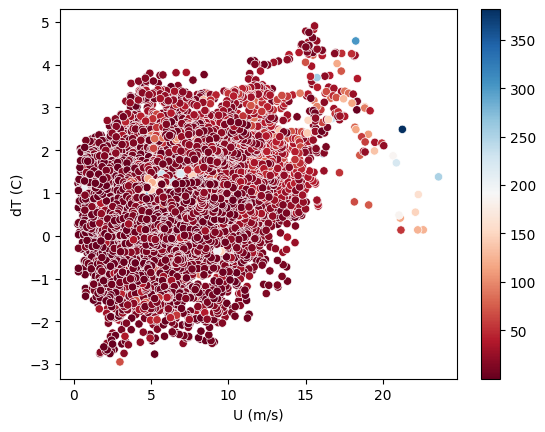

In [36]:
logDf = outDf#[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]
logeraDf = eraDf

h_diff = np.abs(logDf.HApprox_1 - logDf.HCoare_1)

tempdiff = InterpolatedData(x=logeraDf.timemet, y=logeraDf.tsea - logeraDf.ta)
ax = sns.scatterplot(x=logDf.U_anem_1, y=tempdiff.get_vals(logDf.time), palette='RdBu', hue=h_diff)

norm = plt.Normalize(h_diff.min(), h_diff.max())
sm = plt.cm.ScalarMappable(cmap="RdBu", norm=norm)
sm.set_array([])
ax.get_legend().remove()
ax.figure.colorbar(sm)

ax.set_xlabel('U (m/s)')
ax.set_ylabel('dT (C)')
plt.show()

/tmp/ipykernel_14832/1302182983.py:14: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  ax.figure.colorbar(sm)


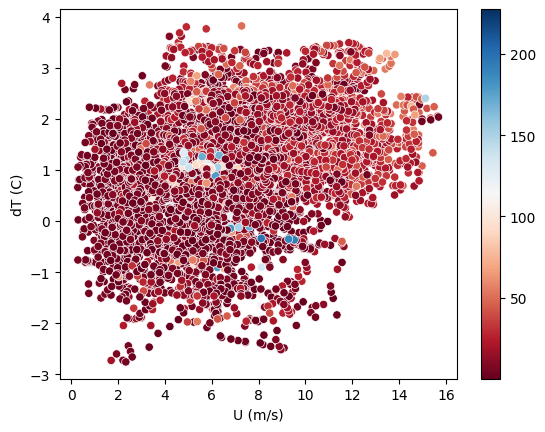

In [31]:
logDf = outDf[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]
logDf = logDf[(logDf.time >= datetime.datetime(2015, 4, 24, 23, 0))]
logeraDf = eraDf

h_diff = np.abs(logDf.HApprox_2 - logDf.HCoare_2)

tempdiff = InterpolatedData(x=logeraDf.timemet, y=logeraDf.tsea - logeraDf.ta)
ax = sns.scatterplot(x=logDf.U_anem_1, y=tempdiff.get_vals(logDf.time), palette='RdBu', hue=h_diff)

norm = plt.Normalize(h_diff.min(), h_diff.max())
sm = plt.cm.ScalarMappable(cmap="RdBu", norm=norm)
sm.set_array([])
ax.get_legend().remove()
ax.figure.colorbar(sm)

ax.set_xlabel('U (m/s)')
ax.set_ylabel('dT (C)')
plt.show()

/tmp/ipykernel_14832/202598067.py:14: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  ax.figure.colorbar(sm)


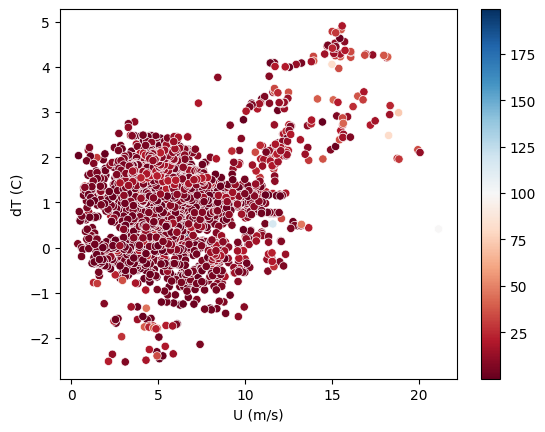

In [32]:
logDf = outDf[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 0.5]
logDf = logDf[(logDf.time < datetime.datetime(2015, 4, 24, 23, 0))]
logeraDf = eraDf

h_diff = np.abs(logDf.HApprox_2 - logDf.HCoare_2)

tempdiff = InterpolatedData(x=logeraDf.timemet, y=logeraDf.tsea - logeraDf.ta)
ax = sns.scatterplot(x=logDf.U_anem_1, y=tempdiff.get_vals(logDf.time), palette='RdBu', hue=h_diff)

norm = plt.Normalize(h_diff.min(), h_diff.max())
sm = plt.cm.ScalarMappable(cmap="RdBu", norm=norm)
sm.set_array([])
ax.get_legend().remove()
ax.figure.colorbar(sm)

ax.set_xlabel('U (m/s)')
ax.set_ylabel('dT (C)')
plt.show()

/tmp/ipykernel_8041/3846193496.py:13: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  ax.figure.colorbar(sm)


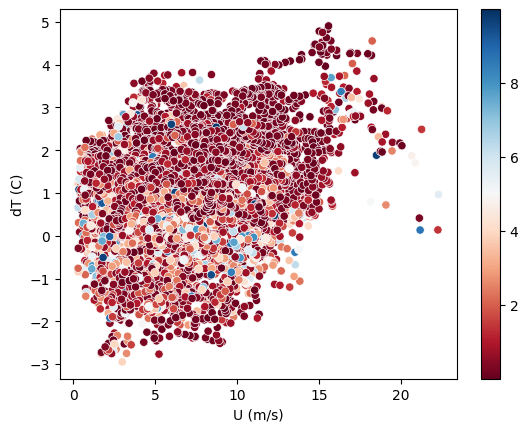

In [83]:
logDf = outDf[relative_percent_difference(outDf, 'HApprox_1', 'HApprox_2') < 10]
logeraDf = eraDf

h_diff = relative_percent_difference(logDf, 'HApprox_1', 'HApprox_2')

tempdiff = InterpolatedData(x=logeraDf.timemet, y=logeraDf.tsea - logeraDf.ta)
ax = sns.scatterplot(x=logDf.U_anem_1, y=tempdiff.get_vals(logDf.time), palette='RdBu', hue=h_diff)

norm = plt.Normalize(h_diff.min(), h_diff.max())
sm = plt.cm.ScalarMappable(cmap="RdBu", norm=norm)
sm.set_array([])
ax.get_legend().remove()
ax.figure.colorbar(sm)

ax.set_xlabel('U (m/s)')
ax.set_ylabel('dT (C)')
plt.show()

Text(0, 0.5, 'Sensible Heat Flux (Wm^-2)')

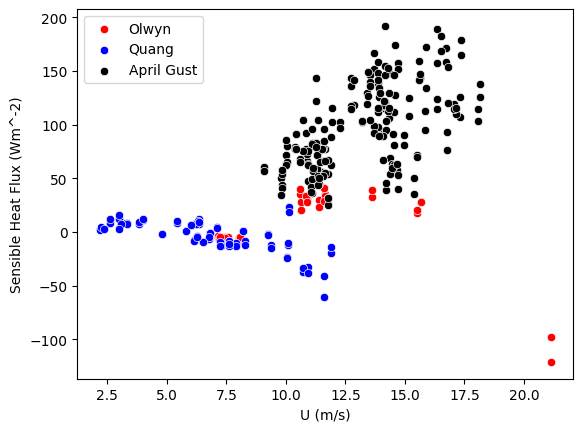

In [6]:
# All events
logDf = outDf[(outDf.time > datetime.datetime(2015, 3, 11, 12, 0)) & (outDf.time < datetime.datetime(2015, 3, 13, 12, 0))]
olwynoutDf = logDf[relative_percent_difference(logDf, 'HApprox_1', 'HApprox_2') < 0.5]

logDf = outDf[(outDf.time > datetime.datetime(2015, 4, 30, 0, 0)) & (outDf.time < datetime.datetime(2015, 5, 2, 23, 0))]
quangoutDf = logDf[relative_percent_difference(logDf, 'HApprox_1', 'HApprox_2') < 0.5]

logDf = outDf[(outDf.time > datetime.datetime(2015, 4, 19, 0, 0)) & (outDf.time < datetime.datetime(2015, 4, 23, 23, 0))]
aproutDf = logDf[relative_percent_difference(logDf, 'HApprox_1', 'HApprox_2') < 0.5]

sns.scatterplot(data=olwynoutDf, x='U_anem_1', y='HApprox_1', label='Olwyn', color='red')
sns.scatterplot(data=olwynoutDf, x='U_anem_1', y='HApprox_2', color='red')
sns.scatterplot(data=quangoutDf, x='U_anem_2', y='HApprox_1', label='Quang', color='blue')
sns.scatterplot(data=quangoutDf, x='U_anem_2', y='HApprox_2', color='blue')
sns.scatterplot(data=aproutDf, x='U_anem_2', y='HApprox_1', label='April Gust', color='k')
sns.scatterplot(data=aproutDf, x='U_anem_2', y='HApprox_2', color='k')
plt.xlabel('U (m/s)')
plt.ylabel('Sensible Heat Flux (Wm^-2)')

Text(0, 0.5, 'Stanton Number (C_H)')

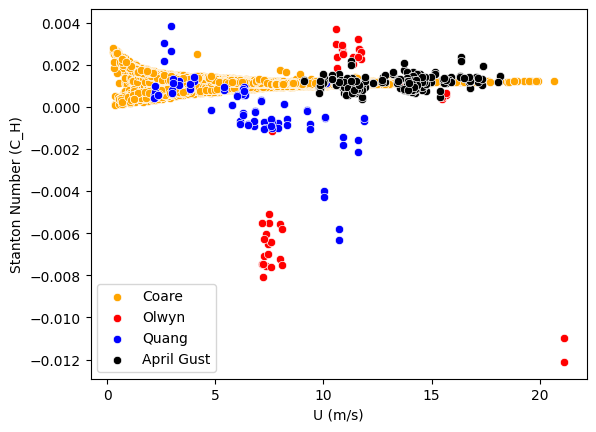

In [9]:
# All events
logDf = outDf[(outDf.time > datetime.datetime(2015, 3, 11, 12, 0)) & (outDf.time < datetime.datetime(2015, 3, 13, 12, 0))]
olwynoutDf = logDf[relative_percent_difference(logDf, 'HApprox_1', 'HApprox_2') < 0.5]

logDf = outDf[(outDf.time > datetime.datetime(2015, 4, 30, 0, 0)) & (outDf.time < datetime.datetime(2015, 5, 2, 23, 0))]
quangoutDf = logDf[relative_percent_difference(logDf, 'HApprox_1', 'HApprox_2') < 0.5]

logDf = outDf[(outDf.time > datetime.datetime(2015, 4, 19, 0, 0)) & (outDf.time < datetime.datetime(2015, 4, 23, 23, 0))]
aproutDf = logDf[relative_percent_difference(logDf, 'HApprox_1', 'HApprox_2') < 0.5]

sns.scatterplot(data=outDf, x='U_anem_2', y='Ch_coare_2', label='Coare', color='orange')
sns.scatterplot(data=olwynoutDf, x='U_anem_1', y='Ch_1', label='Olwyn', color='red')
sns.scatterplot(data=olwynoutDf, x='U_anem_1', y='Ch_2', color='red')
sns.scatterplot(data=quangoutDf, x='U_anem_2', y='Ch_1', label='Quang', color='blue')
sns.scatterplot(data=quangoutDf, x='U_anem_2', y='Ch_2', color='blue')
sns.scatterplot(data=aproutDf, x='U_anem_2', y='Ch_1', label='April Gust', color='k')
sns.scatterplot(data=aproutDf, x='U_anem_2', y='Ch_2', color='k')
plt.xlabel('U (m/s)')
plt.ylabel('Stanton Number (C_H)')
# plt.ylim([-0.025, 0.025])
# plt.xlim([7,21])

Text(0, 0.5, 'Sensible Heat Flux (Wm^-2)')

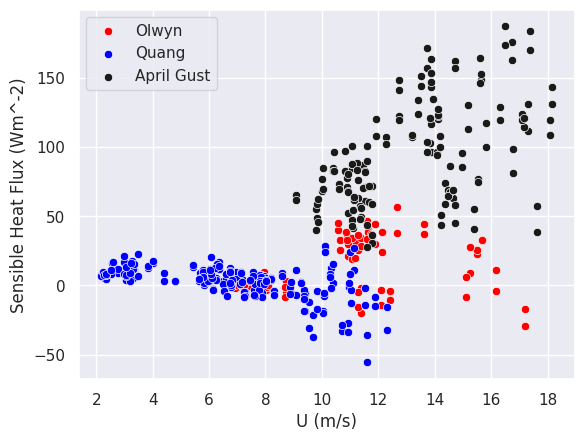

In [268]:
# All events
logDf = outDf[(outDf.time > datetime.datetime(2015, 3, 11, 12, 0)) & (outDf.time < datetime.datetime(2015, 3, 13, 12, 0))]
# logoutDf = logDf[np.abs(logDf['HApprox_2'] - logDf['HApprox_1']) < 20]
# olwynoutDf = logoutDf[relative_percent_difference(logoutDf, 'HApprox_1', 'HApprox_2') < 10]

logDf = outDf[(outDf.time > datetime.datetime(2015, 4, 30, 0, 0)) & (outDf.time < datetime.datetime(2015, 5, 2, 23, 0))]
# logoutDf = logDf[np.abs(logDf['HApprox_2'] - logDf['HApprox_1']) < 20]
# quangoutDf = logoutDf[relative_percent_difference(logoutDf, 'HApprox_1', 'HApprox_2') < 10]

logDf = outDf[(outDf.time > datetime.datetime(2015, 4, 19, 0, 0)) & (outDf.time < datetime.datetime(2015, 4, 23, 23, 0))]
# logoutDf = logDf[np.abs(logDf['HApprox_2'] - logDf['HApprox_1']) < 20]
# aproutDf = logoutDf[relative_percent_difference(logoutDf, 'HApprox_1', 'HApprox_2') < 10]

sns.scatterplot(data=olwynoutDf, x='U_anem_1', y='HApprox_1', label='Olwyn', color='red')
sns.scatterplot(data=olwynoutDf, x='U_anem_1', y='HApprox_2', color='red')
sns.scatterplot(data=quangoutDf, x='U_anem_2', y='HApprox_1', label='Quang', color='blue')
sns.scatterplot(data=quangoutDf, x='U_anem_2', y='HApprox_2', color='blue')
sns.scatterplot(data=aproutDf, x='U_anem_2', y='HApprox_1', label='April Gust', color='k')
sns.scatterplot(data=aproutDf, x='U_anem_2', y='HApprox_2', color='k')
plt.xlabel('U (m/s)')
plt.ylabel('Sensible Heat Flux (Wm^-2)')

Text(0, 0.5, 'Stanton Number (C_H)')

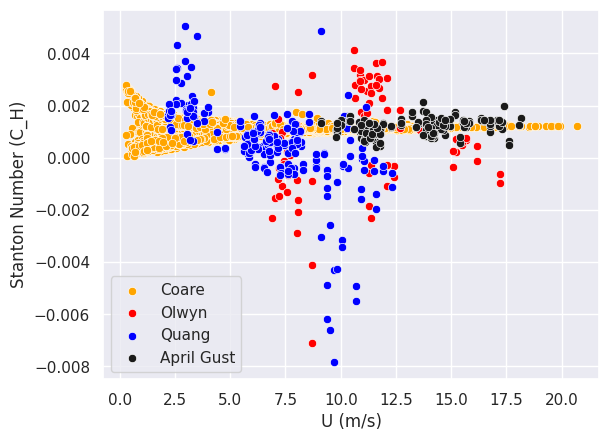

In [267]:
# All events
logDf = outDf[(outDf.time > datetime.datetime(2015, 3, 11, 12, 0)) & (outDf.time < datetime.datetime(2015, 3, 13, 12, 0))]
logoutDf = logDf[np.abs(logDf['HApprox_2'] - logDf['HApprox_1']) < 20]
olwynoutDf = logoutDf[relative_percent_difference(logoutDf, 'HApprox_1', 'HApprox_2') < 10]

logDf = outDf[(outDf.time > datetime.datetime(2015, 4, 30, 0, 0)) & (outDf.time < datetime.datetime(2015, 5, 2, 23, 0))]
logoutDf = logDf[np.abs(logDf['HApprox_2'] - logDf['HApprox_1']) < 20]
quangoutDf = logoutDf[relative_percent_difference(logoutDf, 'HApprox_1', 'HApprox_2') < 10]

logDf = outDf[(outDf.time > datetime.datetime(2015, 4, 19, 0, 0)) & (outDf.time < datetime.datetime(2015, 4, 23, 23, 0))]
logoutDf = logDf[np.abs(logDf['HApprox_2'] - logDf['HApprox_1']) < 20]
aproutDf = logoutDf[relative_percent_difference(logoutDf, 'HApprox_1', 'HApprox_2') < 10]

sns.scatterplot(data=outDf, x='U_anem_2', y='Ch_coare_2', label='Coare', color='orange')
sns.scatterplot(data=olwynoutDf, x='U_anem_1', y='Ch_1', label='Olwyn', color='red')
sns.scatterplot(data=olwynoutDf, x='U_anem_1', y='Ch_2', color='red')
sns.scatterplot(data=quangoutDf, x='U_anem_2', y='Ch_1', label='Quang', color='blue')
sns.scatterplot(data=quangoutDf, x='U_anem_2', y='Ch_2', color='blue')
sns.scatterplot(data=aproutDf, x='U_anem_2', y='Ch_1', label='April Gust', color='k')
sns.scatterplot(data=aproutDf, x='U_anem_2', y='Ch_2', color='k')
plt.xlabel('U (m/s)')
plt.ylabel('Stanton Number (C_H)')
# plt.ylim([-0.025, 0.025])
# plt.xlim([7,21])